# Introduccion

## Predicción de fallas en una bomba de agua: Un enfoque de mantenimiento predictivo

El mantenimiento predictivo es una estrategia de gestión de equipos que busca predecir cuándo es probable que ocurra una falla en un equipo o máquina, con el objetivo de realizar el mantenimiento justo antes de que ocurra. Esta estrategia permite reducir el tiempo de inactividad y aumentar la eficiencia de la maquinaria. En este proyecto, aplicaremos técnicas de machine learning para predecir posibles fallos futuros en una bomba de agua.

## Descripción del conjunto de datos

El conjunto de datos utilizado en este proyecto proviene de una bomba de agua de una planta potabilizadora. Contiene registros de 52 sensores de la bomba, con 220,000 datos tomados cada minuto. El conjunto de datos registra 7 fallas del sistema en el año 2018. Cada sensor proporciona información valiosa sobre aspectos específicos de la máquina, como la temperatura, la vibración, la presión, entre otros.

## Objetivos del proyecto

1. Analizar los datos de los sensores para entender el funcionamiento normal y las fallas de la bomba.
2. Identificar patrones o indicadores que podrían predecir una falla futura.
3. Construir un modelo de machine learning que pueda predecir las fallas de la bomba.

Este análisis es relevante para cualquier industria dentro del marco de la Industria 4.0. Aunque este caso es particular, la metodología aplicada es transferible a cualquier otra máquina o equipo industrial.

## Informacion sobre los sensores y el dataset

El dataset contiene registros de 52 sensores de la bomba, con datos tomados cada minuto. Tenemos un total de 220,000 observaciones, con 7 fallas registradas en el año 2018. Los datos de los sensores están etiquetados de SENSOR_00 a SENSOR_51, y una columna adicional 'machine_status' que indica el estado de la bomba.

Cada sensor proporciona información valiosa sobre aspectos específicos de la máquina, como la temperatura, la vibración, la presión, entre otros. Las lecturas de los sensores serán la base para nuestro análisis y la construcción del modelo de predicción de fallas.

Descripcion de los datos:

SENSOR_00 - Vibración de la carcasa del motor

SENSOR_01 - Frecuencia A del motor

SENSOR_02 - Frecuencia B del motor

SENSOR_03 - Frecuencia C del motor

SENSOR_04 - Velocidad del motor

SENSOR_05 - Corriente del motor

SENSOR_06 - Potencia activa del motor

SENSOR_07 - Potencia aparente del motor

SENSOR_08 - Potencia reactiva del motor

SENSOR_09 - Potencia del eje del motor

SENSOR_10 - Corriente de fase A del motor

SENSOR_11 - Corriente de fase B del motor

SENSOR_12 - Corriente de fase C del motor

SENSOR_13 - Vibración del acoplamiento del motor

SENSOR_14 - Voltaje de fase AB del motor

SENSOR_16 - Voltaje de fase BC del motor

SENSOR_17 - Voltaje de fase CA del motor

SENSOR_18 - Vibración de la carcasa de la bomba

SENSOR_19 - Velocidad del impulsor de la etapa 1 de la bomba

SENSOR_20 - Velocidad del impulsor de la etapa 1 de la bomba

SENSOR_21 - Velocidad del impulsor de la etapa 1 de la bomba

SENSOR_22 - Velocidad del impulsor de la etapa 1 de la bomba

SENSOR_23 - Velocidad del impulsor de la etapa 1 de la bomba

SENSOR_24 - Velocidad del impulsor de la etapa 1 de la bomba

SENSOR_25 - Velocidad del impulsor de la etapa 2 de la bomba

SENSOR_26 - Velocidad del impulsor de la etapa 2 de la bomba

SENSOR_27 - Velocidad del impulsor de la etapa 2 de la bomba

SENSOR_28 - Velocidad del impulsor de la etapa 2 de la bomba

SENSOR_29 - Velocidad del impulsor de la etapa 2 de la bomba

SENSOR_30 - Velocidad del impulsor de la etapa 2 de la bomba

SENSOR_31 - Velocidad del impulsor de la etapa 2 de la bomba

SENSOR_32 - Velocidad del impulsor de la etapa 2 de la bomba

SENSOR_33 - Velocidad del impulsor de la etapa 2 de la bomba

SENSOR_34 - Flujo de entrada de la bomba

SENSOR_35 - Flujo de salida de la bomba

SENSOR_36 - Desconocido de la bomba

SENSOR_37 - Nivel de reserva superior del aceite lubricante de la bomba

SENSOR_38 - Temperatura de retorno del aceite lubricante de la bomba

SENSOR_39 - Temperatura de suministro del aceite lubricante de la bomba

SENSOR_40 - Temperatura activa del cojinete de empuje de la bomba

SENSOR_41 - Temperatura del cojinete radial del extremo no impulsor del motor 1

SENSOR_42 - Temperatura del cojinete radial del extremo no impulsor del motor 2

SENSOR_43 - Temperatura inactiva del cojinete de empuje de la bomba

SENSOR_44 - Temperatura del cojinete radial del extremo impulsor de la bomba 1

SENSOR_45 - Temperatura del cojinete radial del extremo no impulsor de la bomba 1

SENSOR_46 - Temperatura del cojinete radial del extremo no impulsor de la bomba 2

SENSOR_47 - Temperatura del cojinete radial del extremo de accionamiento de la bomba 2

SENSOR_48 - Presión de entrada de la bomba

SENSOR_49 - Temperatura desconocida de la bomba

SENSOR_50 - Presión de descarga de la bomba 1

SENSOR_51 - Presión de descarga de la bomba 2

El estado de la bomba es la última columna y tengo los valores

NORMAL: Funcionamiento normal de la bomba BROKEN: Falla de la bomba RECOVERING: Recuperación al uso “NORMAL” de la bomba, se produce luego de una falla.


# Importación de Librerías

En esta sección, importamos todas las librerías necesarias para realizar el análisis. Aquí está una breve descripción de lo que hace cada una:

1. pandas: Librería para manipulación y análisis de datos. Proporciona estructuras de datos y funciones necesarias para manipular conjuntos de datos numéricos y series de tiempo.
2. numpy: Librería para el soporte de arrays y matrices de gran tamaño, junto con una gran colección de funciones matemáticas para operar con estos elementos.
3. matplotlib: Librería para la generación de gráficos a partir de datos contenidos en listas o arrays.
4. seaborn: Basada en matplotlib, sirve para hacer gráficos estadísticos más atractivos y explicativos.
5. sklearn: Librería para aprendizaje de máquina. Contiene funciones para regresión, clasificación, clustering, entre otros.
6. statsmodels: Librería para estimar y probar modelos estadísticos.


In [45]:
# Importacion de librerias

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.model_selection import RandomizedSearchCV
from scikeras.wrappers import KerasClassifier 
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.neighbors import NearestNeighbors
from keras.models import Sequential
from keras.layers import Dense
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import plotly.graph_objects as go
sns.set_style('whitegrid')

## Funciones propias

Seccion en la que pondre funciones creadas para facilitar y simplificar el codigo.

In [2]:
# Funcion para la grafica estatica de los sensores

def plot_sensors(df, df_mal_clasificados=None):
    num_sensores = df.shape[1] - 3  # Restamos 3 porque hay tres columnas de estado
    fig, axes = plt.subplots(nrows=num_sensores, ncols=1, figsize=(100, 3*num_sensores))

    # Definir colores para cada estado
    colores = {'NORMAL': 'blue', 'RECOVERING': 'black', 'BROKEN': 'red'}

    for idx, sensor in enumerate(df.columns[:-3]):
        ax = axes[idx]
        # Para cada estado, grafica un segmento de línea
        for estado, color in colores.items():
            # Encuentra los puntos donde el 'estado' cambia
            cambios_estado = np.flatnonzero(df[estado].diff().fillna(0).astype(bool))
            # Añadir el último índice del dataframe
            cambios_estado = np.append(cambios_estado, len(df))
            inicio = 0
            for fin in cambios_estado:
                segmento = df[inicio:fin]
                if segmento[estado].iloc[0] == 1:
                    if estado == 'BROKEN':
                        ax.scatter(segmento.index, segmento[sensor], marker='o', color=color, s=50)
                    else:
                        ax.plot(segmento.index, segmento[sensor], color=color)
                inicio = fin

        # Si se proporcionó el DataFrame de mal clasificados, graficar estos puntos
        if df_mal_clasificados is not None:
            falsos_positivos = df_mal_clasificados[df_mal_clasificados['type'] == 'False Positive'].index
            falsos_negativos = df_mal_clasificados[df_mal_clasificados['type'] == 'False Negative'].index

            ax.scatter(falsos_positivos, df.loc[falsos_positivos, sensor], color='orange', s=100, label='False Positive')
            ax.scatter(falsos_negativos, df.loc[falsos_negativos, sensor], color='cyan', s=100, label='False Negative')

        # Marcar los valores nulos con una cruz verde
        nulos = df[df[sensor].isna()].index
        ax.scatter(nulos, [0]*len(nulos), marker='x', color='green', s=10)

        ax.set_title(sensor)
        ax.legend()

    plt.show()

In [3]:
# Funcion para cambiar el nombre de los sensores

def cambiar_nombres_columnas(df):

    sensores_completo = {
    'sensor_00': '00_vibracion_carcasa_motor',
    'sensor_01': '01_frecuencia_a_motor',
    'sensor_02': '02_frecuencia_b_motor',
    'sensor_03': '03_frecuencia_c_motor',
    'sensor_04': '04_velocidad_motor',
    'sensor_05': '05_corriente_motor',
    'sensor_06': '06_potencia_activa_motor',
    'sensor_07': '07_potencia_aparente_motor',
    'sensor_08': '08_potencia_reactiva_motor',
    'sensor_09': '09_potencia_eje_motor',
    'sensor_10': '10_corriente_fase_a_motor',
    'sensor_11': '11_corriente_fase_b_motor',
    'sensor_12': '12_corriente_fase_c_motor',
    'sensor_13': '13_vibracion_acoplamiento_motor',
    'sensor_14': '14_voltaje_fase_ab_motor',
    'sensor_15': '15_sensor_15',
    'sensor_16': '16_voltaje_fase_bc_motor',
    'sensor_17': '17_voltaje_fase_ca_motor',
    'sensor_18': '18_vibracion_carcasa_bomba',
    'sensor_19': '19_velocidad_impulsor_etapa_1_bomba',
    'sensor_20': '20_velocidad_impulsor_etapa_1_bomba',
    'sensor_21': '21_velocidad_impulsor_etapa_1_bomba',
    'sensor_22': '22_velocidad_impulsor_etapa_1_bomba',
    'sensor_23': '23_velocidad_impulsor_etapa_1_bomba',
    'sensor_24': '24_velocidad_impulsor_etapa_1_bomba',
    'sensor_25': '25_velocidad_impulsor_etapa_2_bomba',
    'sensor_26': '26_velocidad_impulsor_etapa_2_bomba',
    'sensor_27': '27_velocidad_impulsor_etapa_2_bomba',
    'sensor_28': '28_velocidad_impulsor_etapa_2_bomba',
    'sensor_29': '29_velocidad_impulsor_etapa_2_bomba',
    'sensor_30': '30_velocidad_impulsor_etapa_2_bomba',
    'sensor_31': '31_velocidad_impulsor_etapa_2_bomba',
    'sensor_32': '32_velocidad_impulsor_etapa_2_bomba',
    'sensor_33': '33_velocidad_impulsor_etapa_2_bomba',
    'sensor_34': '34_flujo_entrada_bomba',
    'sensor_35': '35_flujo_salida_bomba',
    'sensor_36': '36_desconocido_bomba',
    'sensor_37': '37_nivel_reserva_superior_aceite_lubricante_bomba',
    'sensor_38': '38_temperatura_retorno_aceite_lubricante_bomba',
    'sensor_39': '39_temperatura_suministro_aceite_lubricante_bomba',
    'sensor_40': '40_temperatura_activa_cojinete_empuje_bomba',
    'sensor_41': '41_temperatura_cojinete_radial_extremo_no_impulsor_motor_1',
    'sensor_42': '42_temperatura_cojinete_radial_extremo_no_impulsor_motor_2',
    'sensor_43': '43_temperatura_inactiva_cojinete_empuje_bomba',
    'sensor_44': '44_temperatura_cojinete_radial_extremo_impulsor_bomba_1',
    'sensor_45': '45_temperatura_cojinete_radial_extremo_no_impulsor_bomba_1',
    'sensor_46': '46_temperatura_cojinete_radial_extremo_no_impulsor_bomba_2',
    'sensor_47': '47_temperatura_cojinete_radial_extremo_accionamiento_bomba_2',
    'sensor_48': '48_presion_entrada_bomba',
    'sensor_49': '49_temperatura_desconocida_bomba',
    'sensor_50': '50_presion_descarga_bomba_1',
    'sensor_51': '51_presion_descarga_bomba_2',
    }

    nuevas_columnas = {f'sensor_{i:02d}': v for i, v in enumerate(sensores_completo.values())}
    # Cambiar los nombres de las columnas
    df = df.rename(columns=nuevas_columnas)
    return df

# Ejemplo de uso:
# df_nuevo = cambiar_nombres_columnas(df_antiguo)


In [4]:
# Funcion para la grafica de los sensores interactiva

def plot_interactive(df, df_mal_clasificados=None):
    # Definir colores para cada estado
    colores = {'NORMAL': 'blue', 'RECOVERING': 'black', 'BROKEN': 'red'}

    for sensor in df.columns[:-3]:
        # Crear una figura para este sensor
        fig = go.Figure()

        # Para cada estado, grafica un segmento de línea
        for estado, color in colores.items():
            # Encuentra los puntos donde el 'estado' cambia
            cambios_estado = np.flatnonzero(df[estado].diff().fillna(0).astype(bool))
            # Añadir el último índice del dataframe
            cambios_estado = np.append(cambios_estado, len(df))
            inicio = 0
            for fin in cambios_estado:
                segmento = df[inicio:fin]
                if segmento[estado].iloc[0] == 1:
                    # Añadir un trazo al gráfico
                    fig.add_traces(go.Scatter(x=segmento.index, y=segmento[sensor], mode='lines', line=dict(color=color), name=sensor))
                    if estado == 'BROKEN':
                        fig.add_traces(go.Scatter(x=segmento.index, y=segmento[sensor], mode='markers', marker=dict(color=color, symbol='x'), name=sensor))
                inicio = fin

        # Marcar los valores nulos con una cruz verde
        nulos = df[df[sensor].isna()].index
        fig.add_traces(go.Scatter(x=nulos, y=[0]*len(nulos), mode='markers', marker=dict(color='green', symbol='x'), name=sensor))

        # Si se proporcionó el DataFrame de mal clasificados, graficar estos puntos
        if df_mal_clasificados is not None:
            falsos_positivos = df_mal_clasificados[df_mal_clasificados['type'] == 'False Positive'].index
            falsos_negativos = df_mal_clasificados[df_mal_clasificados['type'] == 'False Negative'].index

            fig.add_traces(go.Scatter(x=falsos_positivos, y=df.loc[falsos_positivos, sensor],
                                      mode='markers', marker=dict(color='orange', symbol='square'), name='False Positive'))

            fig.add_traces(go.Scatter(x=falsos_negativos, y=df.loc[falsos_negativos, sensor],
                                      mode='markers', marker=dict(color='cyan', symbol='triangle-up'), name='False Negative'))

        # Actualizar el layout de la figura para ocultar la leyenda y añadir un título
        fig.update_layout(showlegend=False, title=sensor)

        # Mostrar la figura
        fig.show()

In [5]:
# Funcion para la grafica de histogramas

def plot_histogram(df):
    # Definir colores para cada estado
    colores = {'NORMAL': 'blue', 'RECOVERING': 'black', 'BROKEN': 'red'}

    # Crear una figura
    fig = go.Figure()

    for estado, color in colores.items():
        # Filtrar los datos por el estado actual
        df_estado = df[df[estado] == 1]

        for sensor in df.columns[:-3]:
            # Añadir un histograma para este sensor y estado
            fig.add_trace(go.Histogram(x=df_estado[sensor], name=sensor + ' - ' + estado, marker_color=color, opacity=0.75))

    # Actualizar el layout de la figura
    fig.update_layout(barmode='overlay', title='Histograma de los sensores', xaxis_title='Valor', yaxis_title='Frecuencia')
    fig.update_traces(opacity=0.75)

    # Mostrar la figura
    fig.show()

In [6]:
# Funcion grafico de covarianza

def plot_covariance(df, sensor1, sensor2):
    # Filtrar filas donde alguna de las columnas de los sensores tiene NaN
    df_filtered = df.dropna(subset=[sensor1, sensor2])

    # Normalizar los datos
    scaler = StandardScaler()
    df_normalized = df_filtered[[sensor1, sensor2]].copy()
    df_normalized[[sensor1, sensor2]] = scaler.fit_transform(df_normalized[[sensor1, sensor2]])

    # Calcular la covarianza de los datos normalizados
    covariance = df_normalized[[sensor1, sensor2]].cov().iloc[0, 1]
    print(f'Covarianza entre {sensor1} y {sensor2} (datos normalizados): {covariance}')

    # Crear un gráfico de dispersión para los datos normalizados
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=df_normalized[df_filtered['NORMAL'] == 1][sensor1],
                             y=df_normalized[df_filtered['NORMAL'] == 1][sensor2],
                             mode='markers',
                             name='NORMAL',
                             marker=dict(color='blue')))
    fig.add_trace(go.Scatter(x=df_normalized[df_filtered['RECOVERING'] == 1][sensor1],
                             y=df_normalized[df_filtered['RECOVERING'] == 1][sensor2],
                             mode='markers',
                             name='RECOVERING',
                             marker=dict(color='black')))
    fig.add_trace(go.Scatter(x=df_normalized[df_filtered['BROKEN'] == 1][sensor1],
                             y=df_normalized[df_filtered['BROKEN'] == 1][sensor2],
                             mode='markers',
                             name='BROKEN',
                             marker=dict(color='red')))

    # Actualizar el tamaño de la figura
    fig.update_layout(width=1200, height=1200, title=f'Covarianza entre {sensor1} y {sensor2} (datos normalizados)')

    fig.show()


In [7]:
# Normalizar los datos de los sensores
def normalize_series(series):
    return (series - series.min()) / (series.max() - series.min())

def promedio_ponderado(valor1, valor2):
    if pd.isna(valor1) and pd.isna(valor2):
        return np.nan
    elif pd.isna(valor1):
        return valor2
    elif pd.isna(valor2):
        return valor1
    else:
        return (valor1 + valor2) / 2



In [8]:
# Funcion para graficar histogramas

def plot_histograms(df):
    # Definir colores para cada estado
    colores = {'NORMAL': 'blue', 'RECOVERING': 'black', 'BROKEN': 'red'}

    for sensor in df.columns:
        if sensor not in ['NORMAL', 'RECOVERING', 'BROKEN']:
            # Crear una figura para este sensor
            fig = go.Figure()

            for estado, color in colores.items():
                # Filtrar los datos según el estado
                data_estado = df[df[estado] == 1][sensor]

                # Añadir histograma al gráfico
                fig.add_trace(go.Histogram(x=data_estado, name=estado, marker_color=color, opacity=0.75))

            # Actualizar el layout de la figura y mostrar histograma
            fig.update_layout(barmode='overlay', title_text=sensor, xaxis_title_text='Valor', yaxis_title_text='Frecuencia', bargap=0.05)
            fig.show()

# Uso de la función
# plot_histograms(sensores_normalizados)



In [9]:
# Funcion para graficos de cajas

def boxplot_by_state(df):
    # Definir colores para cada estado
    colores = {'NORMAL': 'blue', 'RECOVERING': 'black', 'BROKEN': 'red'}

    for sensor in df.columns[:-3]:  # Excluimos las últimas tres columnas (estados)
        # Crear una figura para este sensor
        fig = go.Figure()

        for estado, color in colores.items():
            fig.add_trace(go.Box(
                y=df[df[estado] == 1][sensor],
                name=estado,
                marker_color=color
            ))

        # Actualizar el layout de la figura y añadir un título
        fig.update_layout(title=sensor)

        # Mostrar la figura
        fig.show()

# Uso de la función
# boxplot_by_state(sensores)


In [10]:
# Funcion para calcular correlaciones

def calcular_correlaciones(df):
    # Transformar columnas OHE a una columna numérica
    df['target_numerico'] = df['NORMAL'] * 0 + df['RECOVERING'] * 1 + df['BROKEN'] * 2

    # Calcular correlación
    correlaciones = df.corr()

    # Devolver correlación con la variable objetivo
    return correlaciones['target_numerico']



In [11]:
# Funcion para analisar como se comportan los sensores momentos antes del fallo, hace la comparativa entre 2 ventanas de tiempo distintas

def analisis_sensores(df, ventana1=15, ventana2=15, tiempo_antes=2):
    sensores_val = df.copy()

    # Eliminando datos con estado 'RECOVERING'
    sensores_val = sensores_val[sensores_val['RECOVERING'] != 1]

    # Puntos de ruptura
    rupturas = sensores_val[sensores_val['BROKEN'] == 1].index

    # Elimino las columnas de estado de la máquina
    sensores_val.drop(['NORMAL', 'RECOVERING', 'BROKEN'], axis=1, inplace=True)

    # Calculo el promedio general de cada sensor
    prom_general = sensores_val.mean(axis=0)

    resultados = {sensor: {} for sensor in sensores_val.columns}

    # Calcular el promedio local para cada falla y ventana y la variación porcentual
    for idx, fecha in enumerate(rupturas, 1):
        for sensor in sensores_val.columns:
            # Calculando los promedios de las ventanas de manera independiente
            prom_ventana1 = sensores_val[sensor].loc[fecha - pd.Timedelta(minutes=tiempo_antes) - pd.Timedelta(minutes=ventana1):fecha - pd.Timedelta(minutes=tiempo_antes)].mean()
            prom_ventana2 = sensores_val[sensor].loc[fecha - pd.Timedelta(minutes=tiempo_antes) - pd.Timedelta(minutes=ventana2):fecha - pd.Timedelta(minutes=tiempo_antes)].mean()

            var_ventana1 = ((prom_ventana1 - prom_general[sensor]) / prom_general[sensor]) * 100
            var_ventana2 = ((prom_ventana2 - prom_general[sensor]) / prom_general[sensor]) * 100
            var_diferencia = var_ventana1 - var_ventana2
            resultados[sensor][f'falla{idx}-var_ventana1'] = var_ventana1
            resultados[sensor][f'falla{idx}-var_ventana2'] = var_ventana2
            resultados[sensor][f'falla{idx}-var_diferencia_entre_ventanas'] = var_diferencia

    df_resultados = pd.DataFrame(resultados).transpose()

    # Gráfico de Variaciones entre Ventanas
    plt.figure(figsize=(15, len(sensores_val.columns)))
    sns.heatmap(df_resultados, center=0, cmap="RdBu_r", annot=True, fmt=".1f")
    plt.title('Variación Porcentual de Ventanas por Falla Respecto a la Media')
    plt.xlabel('Fallas y Ventanas')
    plt.ylabel('Sensores')
    plt.show()



In [12]:
# Funcion para seleccionar variables mas representativas

def stepwise_selection(data, target,SL_in=0.05,SL_out = 0.05):
    initial_features = data.columns.tolist()
    best_features = []
    while (len(initial_features)>0):
        remaining_features = list(set(initial_features)-set(best_features))
        new_pval = pd.Series(index=remaining_features)
        for new_column in remaining_features:
            model = sm.OLS(target, sm.add_constant(data[best_features+[new_column]])).fit()
            new_pval[new_column] = model.pvalues[new_column]
        min_p_value = new_pval.min()
        if(min_p_value<SL_in):
            best_features.append(new_pval.idxmin())
            while(len(best_features)>0):
                best_features_with_constant = sm.add_constant(data[best_features])
                p_values = sm.OLS(target, best_features_with_constant).fit().pvalues[1:]
                max_p_value = p_values.max()
                if(max_p_value >= SL_out):
                    excluded_feature = p_values.idxmax()
                    best_features.remove(excluded_feature)
                else:
                    break
        else:
            break
    return best_features

In [13]:
# Funcion para evaluar modelos Random Forest Classifier

def evaluar_modelo_RFC(X_train, X_test, y_train, y_test):
    # Crear el modelo Random Forest Classifier
    modelo_RFC = RandomForestClassifier(random_state=1)
    modelo_RFC.fit(X_train, y_train)

    # Obtener predicciones del modelo usando X_test
    preds_RFC = modelo_RFC.predict(X_test)

    # Mostrar métricas
    confusion = metrics.confusion_matrix(y_test, preds_RFC)
    accuracy = metrics.accuracy_score(y_test, preds_RFC)
    print("El accuracy es:", str(accuracy))

    precision_positiva = metrics.precision_score(y_test, preds_RFC, pos_label=1)
    precision_negativa = metrics.precision_score(y_test, preds_RFC, pos_label=0)
    print("La precisión positiva es:", str(precision_positiva), "y la negativa es:", str(precision_negativa))

    recall_sensibilidad = metrics.recall_score(y_test, preds_RFC, pos_label=1)
    recall_especificidad = metrics.recall_score(y_test, preds_RFC, pos_label=0)
    print("El recall de sensibilidad es:", str(recall_sensibilidad), "y el recall de especificidad es:", str(recall_especificidad))

    f1_positivo = metrics.f1_score(y_test, preds_RFC, pos_label=1)
    f1_negativo = metrics.f1_score(y_test, preds_RFC, pos_label=0)
    print("El f1 positivo es:", str(f1_positivo), "y el f1 negativo es:", str(f1_negativo))

    # Gráfico de matriz de confusión
    plt.figure(figsize=(10,6))
    cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion, display_labels = ['Negative', 'Positive'])
    cm_display.plot()
    plt.show()

    # Crear DataFrame de falsos positivos y falsos negativos
    false_negatives = (y_test == 1) & (preds_RFC == 0)
    false_positives = (y_test == 0) & (preds_RFC == 1)

    fn_indices = X_test.index[false_negatives]
    fp_indices = X_test.index[false_positives]

    df_fn = pd.DataFrame(index=fn_indices, data={'type': 'False Negative'})
    df_fp = pd.DataFrame(index=fp_indices, data={'type': 'False Positive'})

    result_df = pd.concat([df_fn, df_fp])
    return result_df.sort_index()


In [14]:
# Funcion para aplicar SMOTE al conjunto de datos

def smote(X_train, y_train, k_neighbors=5, oversample_amount=1):
    """
    Implementación básica de SMOTE.

    Parámetros:
    - X_train: DataFrame de pandas o matriz numpy. Características que se quieren sobremuestrear.
    - y_train: Serie de pandas o array numpy. Etiquetas correspondientes.
    - k_neighbors: int. Número de vecinos más cercanos a considerar.
    - oversample_amount: int. Número de veces que se desea sobremuestrear la clase minoritaria.

    Retorna:
    - X_resampled: Datos sobremuestreados.
    - y_resampled: Etiquetas correspondientes.
    """

    # Convertir en numpy array
    X_array = np.array(X_train)
    y_array = np.array(y_train)

    # Filtrar solo las muestras de la clase minoritaria
    minority_samples = X_array[y_array == 1]

    # Usar k vecinos más cercanos para encontrar vecinos
    nn = NearestNeighbors(n_neighbors=k_neighbors)
    nn.fit(minority_samples)

    # Generar nuevas muestras
    new_samples = []
    for sample in minority_samples:
        neighbors = nn.kneighbors([sample], return_distance=False)
        for _ in range(oversample_amount):
            chosen_neighbor = np.random.choice(neighbors[0])
            chosen_sample = minority_samples[chosen_neighbor]
            diff = chosen_sample - sample
            random_gap = np.random.random()
            new_samples.append(sample + random_gap * diff)

    X_resampled = np.vstack([X_array, np.array(new_samples)])
    y_resampled = np.hstack([y_array, [1] * len(new_samples)])
    df_resampled = pd.DataFrame(X_resampled, columns=X_train.columns)

    return df_resampled, y_resampled


In [15]:
# Funcion para realizar la comparacion entre distintos SMOTE

def smote_comparison(X_train, y_train, k_neighbors=5, oversample_options=[1, 2, 3]):
    """
    Implementa SMOTE para varias opciones de sobremuestreo y compara los resultados.

    Parámetros:
    - X_train: DataFrame de pandas. Características que se quieren sobremuestrear.
    - y_train: Serie de pandas. Etiquetas correspondientes.
    - k_neighbors: int. Número de vecinos más cercanos a considerar.
    - oversample_options: list. Lista con las diferentes opciones de sobremuestreo.

    Retorna:
    - resampled_data: diccionario. Claves son las opciones de sobremuestreo y los valores son tuplas con
                      (X_resampled, y_resampled).
    """

    # Almacenar los datos sobremuestrados
    data_sobremuestrada = {}

    # Almacenar los datos para el gráfico
    original_broken = y_train.sum()
    original_normal = len(y_train) - original_broken

    broken_list = [original_broken]
    normal_list = [original_normal]

    # Realizar sobremuestreo para cada opción
    for amount in oversample_options:
        df_resampled, y_resampled = smote(X_train, y_train, k_neighbors, amount)
        broken = y_resampled.sum()
        normal = len(y_resampled) - broken
        broken_list.append(broken)
        normal_list.append(normal)
        data_sobremuestrada[amount] = (df_resampled, pd.Series(y_resampled))

    # Categorías para el eje X
    categories = ['Original'] + list(map(str, oversample_options))

    # Crear gráfico de barras apiladas
    fig = go.Figure(data=[
        go.Bar(name='Broken', x=categories, y=broken_list),
        go.Bar(name='Normal', x=categories, y=normal_list)
    ])

    # Cambiar el modo de las barras a 'stack'
    fig.update_layout(barmode='stack', title='SMOTE Comparacion de sobremuestreos',
                     xaxis_title='Dataset Type', yaxis_title='Count')

    fig.show()

    return data_sobremuestrada

# Esta función ahora debería mostrar las barras equidistantes en el eje X, independientemente de las opciones de sobremuestreo.



In [16]:
# Funcion para evaluar una regresion logistica

def evaluar_modelo_logistica(X_train, X_test, y_train, y_test, max_iter = 10000):
    # Crear el modelo de Regresión Logística
    modelo_LR = LogisticRegression(random_state=1, max_iter=max_iter)
    modelo_LR.fit(X_train, y_train)

    # Obtener predicciones del modelo usando X_test
    preds_LR = modelo_LR.predict(X_test)

    # Mostrar métricas
    confusion = metrics.confusion_matrix(y_test, preds_LR)
    accuracy = metrics.accuracy_score(y_test, preds_LR)
    print("El accuracy es:", str(accuracy))

    precision_positiva = metrics.precision_score(y_test, preds_LR, pos_label=1)
    precision_negativa = metrics.precision_score(y_test, preds_LR, pos_label=0)
    print("La precisión positiva es:", str(precision_positiva), "y la negativa es:", str(precision_negativa))

    recall_sensibilidad = metrics.recall_score(y_test, preds_LR, pos_label=1)
    recall_especificidad = metrics.recall_score(y_test, preds_LR, pos_label=0)
    print("El recall de sensibilidad es:", str(recall_sensibilidad), "y el recall de especificidad es:", str(recall_especificidad))

    f1_positivo = metrics.f1_score(y_test, preds_LR, pos_label=1)
    f1_negativo = metrics.f1_score(y_test, preds_LR, pos_label=0)
    print("El f1 positivo es:", str(f1_positivo), "y el f1 negativo es:", str(f1_negativo))

    # Gráfico de matriz de confusión
    plt.figure(figsize=(10,6))
    cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion, display_labels = ['Negative', 'Positive'])
    cm_display.plot()
    plt.show()

    # Crear DataFrame de falsos positivos y falsos negativos
    false_negatives = (y_test == 1) & (preds_LR == 0)
    false_positives = (y_test == 0) & (preds_LR == 1)

    fn_indices = X_test.index[false_negatives]
    fp_indices = X_test.index[false_positives]

    df_fn = pd.DataFrame(index=fn_indices, data={'type': 'False Negative'})
    df_fp = pd.DataFrame(index=fp_indices, data={'type': 'False Positive'})

    result_df = pd.concat([df_fn, df_fp])
    return result_df.sort_index()

In [17]:
# Funcion para analizar una red neuronal 1 capa oculta

def evaluar_red_neuronal_viz(X_train, y_train, X_test, y_test, epochs=10, batch_size=32):
    # Definir la arquitectura de la red neuronal
    modelo = Sequential()
    modelo.add(Dense(32, activation='relu', input_dim=X_train.shape[1]))  # Capa de entrada y primera capa oculta
    modelo.add(Dense(16, activation='relu'))  # Segunda capa oculta
    modelo.add(Dense(1, activation='sigmoid'))  # Capa de salida

    # Compilar el modelo
    modelo.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Entrenar el modelo y guardar la historia
    historia = modelo.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=1, validation_data=(X_test, y_test))

    # Predecir en el conjunto de prueba
    y_pred = (modelo.predict(X_test) > 0.5).astype(int).flatten()

    # Mostrar métricas
    print("Accuracy:", metrics.accuracy_score(y_test, y_pred))
    print("Precision:", metrics.precision_score(y_test, y_pred))
    print("Recall:", metrics.recall_score(y_test, y_pred))
    print("F1 Score:", metrics.f1_score(y_test, y_pred))

    # Matriz de confusión
    cm = metrics.confusion_matrix(y_test, y_pred)
    print("Matriz de confusión:")
    print(cm)

    # Crear DataFrame de falsos positivos y falsos negativos
    false_negatives = (y_test == 1) & (y_pred == 0)
    false_positives = (y_test == 0) & (y_pred == 1)

    fn_indices = X_test.index[false_negatives]
    fp_indices = X_test.index[false_positives]

    df_fn = pd.DataFrame(index=fn_indices, data={'type': 'False Negative'})
    df_fp = pd.DataFrame(index=fp_indices, data={'type': 'False Positive'})

    result_df = pd.concat([df_fn, df_fp])

    # Gráfico de matriz de confusión
    plt.figure(figsize=(10,6))
    cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = ['Negative', 'Positive'])
    cm_display.plot()
    plt.show()

    # Graficar el entrenamiento
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(historia.history['loss'], label='Entrenamiento')
    plt.plot(historia.history['val_loss'], label='Validación')
    plt.title('Pérdida (Loss) durante el entrenamiento')
    plt.xlabel('Época')
    plt.ylabel('Pérdida')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(historia.history['accuracy'], label='Entrenamiento')
    plt.plot(historia.history['val_accuracy'], label='Validación')
    plt.title('Precisión (Accuracy) durante el entrenamiento')
    plt.xlabel('Época')
    plt.ylabel('Precisión')
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Devolver el modelo y el DataFrame con los resultados
    return modelo, result_df

In [18]:
# Funcion para analizar una red neuronal 2 capas ocultas


def evaluar_red_neuronal_viz2(X_train, y_train, X_test, y_test, epochs=10, batch_size=32):
    # Definir la arquitectura de la red neuronal
    modelo = Sequential()
    modelo.add(Dense(32, activation='relu', input_dim=X_train.shape[1]))  # Capa de entrada y primera capa oculta
    modelo.add(Dense(16, activation='relu'))  # Segunda capa oculta
    modelo.add(Dense(1, activation='sigmoid'))  # Capa de salida

    # Compilar el modelo
    modelo.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Entrenar el modelo y guardar la historia
    historia = modelo.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=1, validation_data=(X_test, y_test))

    # Predecir en el conjunto de prueba
    y_pred = (modelo.predict(X_test) > 0.5).astype(int).flatten()

    # Mostrar métricas
    print("Accuracy:", metrics.accuracy_score(y_test, y_pred))
    print("Precision:", metrics.precision_score(y_test, y_pred))
    print("Recall:", metrics.recall_score(y_test, y_pred))
    print("F1 Score:", metrics.f1_score(y_test, y_pred))

    # Matriz de confusión
    cm = metrics.confusion_matrix(y_test, y_pred)
    print("Matriz de confusión:")
    print(cm)

    # Crear DataFrame de falsos positivos y falsos negativos
    false_negatives = (y_test == 1) & (y_pred == 0)
    false_positives = (y_test == 0) & (y_pred == 1)

    fn_indices = X_test.index[false_negatives]
    fp_indices = X_test.index[false_positives]

    df_fn = pd.DataFrame(index=fn_indices, data={'type': 'False Negative'})
    df_fp = pd.DataFrame(index=fp_indices, data={'type': 'False Positive'})

    result_df = pd.concat([df_fn, df_fp])

    # Gráfico de matriz de confusión
    plt.figure(figsize=(10,6))
    cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = ['Negative', 'Positive'])
    cm_display.plot()
    plt.show()

    # Graficar el entrenamiento
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(historia.history['loss'], label='Entrenamiento')
    plt.plot(historia.history['val_loss'], label='Validación')
    plt.title('Pérdida (Loss) durante el entrenamiento')
    plt.xlabel('Época')
    plt.ylabel('Pérdida')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(historia.history['accuracy'], label='Entrenamiento')
    plt.plot(historia.history['val_accuracy'], label='Validación')
    plt.title('Precisión (Accuracy) durante el entrenamiento')
    plt.xlabel('Época')
    plt.ylabel('Precisión')
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Devolver el modelo y el DataFrame con los resultados
    return modelo, result_df

In [19]:
# Funcion para evaluar regresion logistica con Random Search

def evaluar_modelo_logistica_RS(X_train, y_train, X_test, y_test):
    param_distributions = {
        'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
        'penalty': ['l2'],
        'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000]
    }


    modelo_LR = LogisticRegression(random_state=1, max_iter=10000)
    random_search = RandomizedSearchCV(modelo_LR, param_distributions, cv=3, n_iter=10, error_score='raise', verbose=1)
    random_search.fit(X_train, y_train)
    
    best_model = random_search.best_estimator_
    preds_LR = best_model.predict(X_test)

    # Mostrar métricas
    confusion = metrics.confusion_matrix(y_test, preds_LR)
    print("El accuracy es:", metrics.accuracy_score(y_test, preds_LR))
    print("La precisión positiva es:", metrics.precision_score(y_test, preds_LR, pos_label=1))
    print("La precisión negativa es:", metrics.precision_score(y_test, preds_LR, pos_label=0))
    print("El recall de sensibilidad es:", metrics.recall_score(y_test, preds_LR, pos_label=1))
    print("El recall de especificidad es:", metrics.recall_score(y_test, preds_LR, pos_label=0))
    print("El f1 positivo es:", metrics.f1_score(y_test, preds_LR, pos_label=1))
    print("El f1 negativo es:", metrics.f1_score(y_test, preds_LR, pos_label=0))

    # Gráfico de matriz de confusión
    plt.figure(figsize=(10,6))
    cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix=confusion, display_labels=['Negative', 'Positive'])
    cm_display.plot()
    plt.show()

    # Crear DataFrame de falsos positivos y falsos negativos
    false_negatives = (y_test == 1) & (preds_LR == 0)
    false_positives = (y_test == 0) & (preds_LR == 1)

    fn_indices = X_test.index[false_negatives]
    fp_indices = X_test.index[false_positives]

    df_fn = pd.DataFrame(index=fn_indices, data={'type': 'False Negative'})
    df_fp = pd.DataFrame(index=fp_indices, data={'type': 'False Positive'})

    result_df = pd.concat([df_fn, df_fp])

    print("Mejores hiperparámetros: ", random_search.best_params_)


    return best_model, result_df


In [60]:
# Funciones para buscar los mejores parametros de Redes Neuronales con 2 capaz ocultas con Random Search CV

# Funciones para buscar los mejores parametros de Redes Neuronales con 4 capaz ocultas con Random Search CV

def create_model(optimizer='adam', neurons1=32, neurons2=16, neurons3=8, neurons4=4):
    model = Sequential()
    model.add(Dense(neurons1, activation='relu', input_dim=X_train.shape[1]))
    model.add(Dense(neurons2, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    return model

def evaluar_red_neuronal_viz_RS(X_train, y_train, X_test, y_test):
    model = KerasClassifier(model=create_model, epochs=10, batch_size=32, optimizer='adam', neurons1=None, neurons2=None, verbose=0)
    
    param_distributions = {
        'optimizer': ['adam', 'rmsprop'],
        'neurons1': [32, 64, 128, 256],
        'neurons2': [16, 32, 64, 128],
        'batch_size': [32, 64, 128],
        'epochs': [10, 20]
    }

    random_search = RandomizedSearchCV(estimator=model, param_distributions=param_distributions, cv=3, n_iter=20, verbose=1)
    random_search_result = random_search.fit(X_train, y_train)

    best_params = random_search_result.best_params_

    # Re-entrenar el mejor modelo para capturar el objeto history
    best_model = create_model(optimizer=best_params['optimizer'], neurons1=best_params['neurons1'], neurons2=best_params['neurons2'])
    history = best_model.fit(X_train, y_train, epochs=best_params['epochs'], batch_size=best_params['batch_size'], validation_data=(X_test, y_test))

    y_pred = (best_model.predict(X_test) > 0.5).astype(int).flatten()

    print("Accuracy:", accuracy_score(y_test, y_pred))
    print("Precision:", precision_score(y_test, y_pred))
    print("Recall:", recall_score(y_test, y_pred))
    print("F1 Score:", f1_score(y_test, y_pred))

    cm = confusion_matrix(y_test, y_pred)
    print("Matriz de confusión:")
    print(cm)

    # Gráfico de matriz de confusión
    plt.figure(figsize=(10,6))
    cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Negative', 'Positive'])
    cm_display.plot()
    plt.show()

    # Grafico de perdidas durante el entrenamiento

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Entrenamiento')
    plt.plot(history.history['val_loss'], label='Validación')
    plt.title('Pérdida durante el entrenamiento')
    plt.xlabel('Época')
    plt.ylabel('Pérdida')
    plt.legend()

    # Grafico de precision durante el entrenamiento

    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Entrenamiento')
    plt.plot(history.history['val_accuracy'], label='Validación')
    plt.title('Precisión durante el entrenamiento')
    plt.xlabel('Época')
    plt.ylabel('Precisión')
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Crear DataFrame de falsos positivos y falsos negativos
    false_negatives = (y_test == 1) & (y_pred == 0)
    false_positives = (y_test == 0) & (y_pred == 1)

    fn_indices = X_test.index[false_negatives]
    fp_indices = X_test.index[false_positives]

    df_fn = pd.DataFrame(index=fn_indices, data={'type': 'False Negative'})
    df_fp = pd.DataFrame(index=fp_indices, data={'type': 'False Positive'})

    result_df = pd.concat([df_fn, df_fp])

    print("Mejores hiperparámetros: ", random_search.best_params_)

    return best_model, result_df


In [61]:
# Funciones para buscar los mejores parametros de Redes Neuronales con 3 capaz ocultas con Random Search CV


def create_model2(optimizer='adam', neurons1=32, neurons2=16, neurons3=8):
    # Crear un modelo secuencial
    model = Sequential()
    # Primera capa oculta y capa de entrada
    model.add(Dense(neurons1, activation='relu', input_dim=X_train.shape[1]))
    # Segunda capa oculta
    model.add(Dense(neurons2, activation='relu'))
    # Tercera capa oculta
    model.add(Dense(neurons3, activation='relu'))
    # Capa de salida
    model.add(Dense(1, activation='sigmoid'))

    # Compilar el modelo
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    return model


def evaluar_red_neuronal_viz_RS2(X_train, y_train, X_test, y_test):
    # Envolver modelo para scikit-learn
    model = KerasClassifier(model=create_model2, epochs=10, batch_size=32, optimizer='adam', neurons1=None, neurons2=None, neurons3=None, verbose=0)

    # Definir hiperparámetros y sus rangos
    param_distributions = {
        'optimizer': ['adam', 'rmsprop'],
        'neurons1': [32, 64, 128],
        'neurons2': [16, 32, 64],
        'neurons3': [8, 16, 32],
        'batch_size': [32, 64, 128],
        'epochs': [10, 20]
    }

    # Búsqueda aleatoria
    random_search = RandomizedSearchCV(estimator=model, param_distributions=param_distributions, cv=3, n_iter=10, verbose=1)
    random_search_result = random_search.fit(X_train, y_train)

    # Resultados
    print("Mejores hiperparámetros: %s \nMejor score: %s" % (random_search_result.best_params_, random_search_result.best_score_))

    # Predecir con el mejor modelo
    best_model = random_search_result.best_estimator_.model_
    y_pred = (best_model.predict(X_test) > 0.5).astype(int).flatten()

    # Mostrar métricas
    print("Accuracy:", accuracy_score(y_test, y_pred))
    print("Precision:", precision_score(y_test, y_pred))
    print("Recall:", recall_score(y_test, y_pred))
    print("F1 Score:", f1_score(y_test, y_pred))

    # Matriz de confusión
    cm = confusion_matrix(y_test, y_pred)
    print("Matriz de confusión:")
    print(cm)

    # Gráfico de matriz de confusión
    plt.figure(figsize=(10,6))
    cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Negative', 'Positive'])
    cm_display.plot()
    plt.show()

    # Crear DataFrame de falsos positivos y falsos negativos
    false_negatives = (y_test == 1) & (y_pred == 0)
    false_positives = (y_test == 0) & (y_pred == 1)

    fn_indices = X_test.index[false_negatives]
    fp_indices = X_test.index[false_positives]

    df_fn = pd.DataFrame(index=fn_indices, data={'type': 'False Negative'})
    df_fp = pd.DataFrame(index=fp_indices, data={'type': 'False Positive'})

    result_df = pd.concat([df_fn, df_fp])

    print("Mejores hiperparámetros: ", random_search.best_params_)

    return best_model, result_df


In [42]:
# Funciones para buscar los mejores parametros de Redes Neuronales con 4 capaz ocultas con Random Search CV

def create_model3(optimizer='adam', neurons1=32, neurons2=16, neurons3=8, neurons4=4):
    model = Sequential()
    model.add(Dense(neurons1, activation='relu', input_dim=X_train.shape[1]))
    model.add(Dense(neurons2, activation='relu'))
    model.add(Dense(neurons3, activation='relu'))
    model.add(Dense(neurons4, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    return model

def evaluar_red_neuronal_viz_RS3(X_train, y_train, X_test, y_test):
    model = KerasClassifier(model=create_model3, epochs=10, batch_size=32, optimizer='adam', neurons1=None, neurons2=None, neurons3=None, neurons4=None, verbose=0)
    
    param_distributions = {
        'optimizer': ['adam', 'rmsprop'],
        'neurons1': [32, 64, 128, 256],
        'neurons2': [16, 32, 64, 128],
        'neurons3': [8, 16, 32, 64],
        'neurons4': [4, 8, 16, 32],
        'batch_size': [32, 64, 128],
        'epochs': [10, 20]
    }

    random_search = RandomizedSearchCV(estimator=model, param_distributions=param_distributions, cv=3, n_iter=20, verbose=1)
    random_search_result = random_search.fit(X_train, y_train)

    best_params = random_search_result.best_params_

    # Re-entrenar el mejor modelo para capturar el objeto history
    best_model = create_model3(optimizer=best_params['optimizer'], neurons1=best_params['neurons1'], neurons2=best_params['neurons2'], neurons3=best_params['neurons3'], neurons4=best_params['neurons4'])
    history = best_model.fit(X_train, y_train, epochs=best_params['epochs'], batch_size=best_params['batch_size'], validation_data=(X_test, y_test))

    y_pred = (best_model.predict(X_test) > 0.5).astype(int).flatten()

    print("Accuracy:", accuracy_score(y_test, y_pred))
    print("Precision:", precision_score(y_test, y_pred))
    print("Recall:", recall_score(y_test, y_pred))
    print("F1 Score:", f1_score(y_test, y_pred))

    cm = confusion_matrix(y_test, y_pred)
    print("Matriz de confusión:")
    print(cm)

    # Gráfico de matriz de confusión
    plt.figure(figsize=(10,6))
    cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Negative', 'Positive'])
    cm_display.plot()
    plt.show()

    # Grafico de perdidas durante el entrenamiento

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Entrenamiento')
    plt.plot(history.history['val_loss'], label='Validación')
    plt.title('Pérdida durante el entrenamiento')
    plt.xlabel('Época')
    plt.ylabel('Pérdida')
    plt.legend()

    # Grafico de precision durante el entrenamiento

    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Entrenamiento')
    plt.plot(history.history['val_accuracy'], label='Validación')
    plt.title('Precisión durante el entrenamiento')
    plt.xlabel('Época')
    plt.ylabel('Precisión')
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Crear DataFrame de falsos positivos y falsos negativos
    false_negatives = (y_test == 1) & (y_pred == 0)
    false_positives = (y_test == 0) & (y_pred == 1)

    fn_indices = X_test.index[false_negatives]
    fp_indices = X_test.index[false_positives]

    df_fn = pd.DataFrame(index=fn_indices, data={'type': 'False Negative'})
    df_fp = pd.DataFrame(index=fp_indices, data={'type': 'False Positive'})

    result_df = pd.concat([df_fn, df_fp])

    print("Mejores hiperparámetros: ", random_search.best_params_)

    return best_model, result_df

# Importación y preprocesamiento de datos

Cargamos los datos de un archivo CSV. Los datos representan las lecturas de varios sensores de una bomba. Cada fila del conjunto de datos representa una lectura de sensor en un punto específico del tiempo.


In [20]:
# Cargo los datos

sensores = pd.read_csv('C:/MIS DOCUMENTOS - DISCO PRINCIPAL/Data Science/coderhouse/sensor.csv')

# Observo el dataframe

sensores.head()

,Unnamed: 0,timestamp,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,...,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,sensor_50,sensor_51,machine_status
0,0,2018-04-01 00:00:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,...,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889,NORMAL
1,1,2018-04-01 00:01:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,...,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889,NORMAL
2,2,2018-04-01 00:02:00,2.444734,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,...,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,241.3194,203.7037,NORMAL
3,3,2018-04-01 00:03:00,2.460474,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,...,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028,240.4514,203.1250,NORMAL
4,4,2018-04-01 00:04:00,2.445718,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,...,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093,242.1875,201.3889,NORMAL


In [21]:
# Cambio el nombre generico "sensor_XX" por su nombre real

sensores = cambiar_nombres_columnas(sensores)

In [22]:
# Verifico si la fecha esta como un Datetime

print(type(sensores['timestamp']))

<class 'pandas.core.series.Series'>


In [23]:
# Modifico el timestamp para que sea un datetime y lo pongo como indice

sensores['timestamp'] = pd.to_datetime(sensores['timestamp'])
sensores.set_index('timestamp', inplace=True)
sensores.drop('Unnamed: 0', axis=1, inplace=True)
sensores.head()

,00_vibracion_carcasa_motor,01_frecuencia_a_motor,02_frecuencia_b_motor,03_frecuencia_c_motor,04_velocidad_motor,05_corriente_motor,06_potencia_activa_motor,07_potencia_aparente_motor,08_potencia_reactiva_motor,09_potencia_eje_motor,...,43_temperatura_inactiva_cojinete_empuje_bomba,44_temperatura_cojinete_radial_extremo_impulsor_bomba_1,45_temperatura_cojinete_radial_extremo_no_impulsor_bomba_1,46_temperatura_cojinete_radial_extremo_no_impulsor_bomba_2,47_temperatura_cojinete_radial_extremo_accionamiento_bomba_2,48_presion_entrada_bomba,49_temperatura_desconocida_bomba,50_presion_descarga_bomba_1,51_presion_descarga_bomba_2,machine_status
timestamp,,,,,,,,,,,,,,,,,,,,,
2018-04-01 00:00:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889,NORMAL
2018-04-01 00:01:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889,NORMAL
2018-04-01 00:02:00,2.444734,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,15.61777,15.01013,...,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,241.3194,203.7037,NORMAL
2018-04-01 00:03:00,2.460474,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,15.69734,15.08247,...,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028,240.4514,203.1250,NORMAL
2018-04-01 00:04:00,2.445718,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,15.69734,15.08247,...,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093,242.1875,201.3889,NORMAL


In [24]:
# Buscando valores NaN en el dataset

sensores.isnull().sum()

00_vibracion_carcasa_motor                                       10208
01_frecuencia_a_motor                                              369
02_frecuencia_b_motor                                               19
03_frecuencia_c_motor                                               19
04_velocidad_motor                                                  19
05_corriente_motor                                                  19
06_potencia_activa_motor                                          4798
07_potencia_aparente_motor                                        5451
08_potencia_reactiva_motor                                        5107
09_potencia_eje_motor                                             4595
10_corriente_fase_a_motor                                           19
11_corriente_fase_b_motor                                           19
12_corriente_fase_c_motor                                           19
13_vibracion_acoplamiento_motor                                     19
14_vol

Considerando que lo que me interesa son los datos de la bomba trabajando en estado "NORMAL", ya que el estado de "RECOVERING" se da mientras el equipo esta retornando a su estadio normal, voy a analizar los valores nulos solo de los estados "NORMALES".

In [25]:
# Buscando valores NaN solo cuando el estado es "NORMAL"

sensores[sensores['machine_status'] == 'NORMAL'].isnull().sum()

00_vibracion_carcasa_motor                                          14
01_frecuencia_a_motor                                              339
02_frecuencia_b_motor                                               14
03_frecuencia_c_motor                                               14
04_velocidad_motor                                                  14
05_corriente_motor                                                  14
06_potencia_activa_motor                                            14
07_potencia_aparente_motor                                          14
08_potencia_reactiva_motor                                          14
09_potencia_eje_motor                                               14
10_corriente_fase_a_motor                                           14
11_corriente_fase_b_motor                                           14
12_corriente_fase_c_motor                                           14
13_vibracion_acoplamiento_motor                                     14
14_vol

Con este analisis veo que el sensor 15 tiene todos sus datos nulos, el sensor 50 casi la mayoria y el 51 una gran cantidad.
Como primer paso voy a eliminar el sensor 15 y luego graficar los otros sensores para encontrar valores anomalos esporadicos debido a una mala toma de datos de los sensores, esto se puede deber a interferencias externas, ruidos electronicos, variacion del suministro electrico, entre otros factores.

In [26]:
# Elimino el sensor 15 ya que todos sus datos son NaN

sensores.drop('15_sensor_15', axis=1, inplace=True)

In [27]:
# Realizo un One Hot Encoding de la columna "machine_status"

sensores_cate = sensores.copy()

sensores = pd.get_dummies(sensores, columns = ['machine_status'])
sensores = sensores.rename(columns={'machine_status_BROKEN': 'BROKEN', 'machine_status_NORMAL': 'NORMAL', 'machine_status_RECOVERING': 'RECOVERING'})

# Exploración inicial de los datos (EDA)

Continuo con el preprocesamiento de datos y luego aplico un EDA

In [ ]:
sensores.describe()

,00_vibracion_carcasa_motor,01_frecuencia_a_motor,02_frecuencia_b_motor,03_frecuencia_c_motor,04_velocidad_motor,05_corriente_motor,06_potencia_activa_motor,07_potencia_aparente_motor,08_potencia_reactiva_motor,09_potencia_eje_motor,...,42_temperatura_cojinete_radial_extremo_no_impulsor_motor_2,43_temperatura_inactiva_cojinete_empuje_bomba,44_temperatura_cojinete_radial_extremo_impulsor_bomba_1,45_temperatura_cojinete_radial_extremo_no_impulsor_bomba_1,46_temperatura_cojinete_radial_extremo_no_impulsor_bomba_2,47_temperatura_cojinete_radial_extremo_accionamiento_bomba_2,48_presion_entrada_bomba,49_temperatura_desconocida_bomba,50_presion_descarga_bomba_1,51_presion_descarga_bomba_2
count,210112.000000,219951.000000,220301.000000,220301.000000,220301.000000,220301.000000,215522.000000,214869.000000,215213.000000,215725.000000,...,220293.000000,220293.000000,220293.000000,220293.000000,220293.000000,220293.000000,220293.000000,220293.000000,143303.000000,204937.000000
mean,2.372221,47.591611,50.867392,43.752481,590.673936,73.396414,13.501537,15.843152,15.200721,14.799210,...,35.453455,43.879591,42.656877,43.094984,48.018585,44.340903,150.889044,57.119968,183.049260,202.699667
std,0.412227,3.296666,3.666820,2.418887,144.023912,17.298247,2.163736,2.201155,2.037390,2.091963,...,10.259521,11.044404,11.576355,12.837520,15.641284,10.442437,82.244957,19.143598,65.258650,109.588607
min,0.000000,0.000000,33.159720,31.640620,2.798032,0.000000,0.014468,0.000000,0.028935,0.000000,...,22.135416,24.479166,25.752316,26.331018,26.331018,27.199070,26.331018,26.620370,27.488426,27.777779
25%,2.438831,46.310760,50.390620,42.838539,626.620400,69.976260,13.346350,15.907120,15.183740,15.053530,...,32.812500,39.583330,36.747684,36.747684,40.509258,39.062500,83.912030,47.743060,167.534700,179.108800
50%,2.456539,48.133678,51.649300,44.227428,632.638916,75.576790,13.642940,16.167530,15.494790,15.082470,...,35.156250,42.968750,40.509260,40.219910,44.849540,42.534720,138.020800,52.662040,193.865700,197.338000
75%,2.499826,49.479160,52.777770,45.312500,637.615723,80.912150,14.539930,16.427950,15.697340,15.118630,...,36.979164,46.614580,45.138890,44.849540,51.215280,46.585650,208.333300,60.763890,219.907400,216.724500
max,2.549016,56.727430,56.032990,48.220490,800.000000,99.999880,22.251160,23.596640,24.348960,25.000000,...,374.218800,408.593700,1000.000000,320.312500,370.370400,303.530100,561.632000,464.409700,1000.000000,1000.000000


## Graficas para ver datos anomalos esporadicos

Estamos analizando datos de sensores de una bomba de agua. Debido a una variedad de factores físicos, como interferencias externas, ruido electrónico y variaciones por términos eléctricos, es común que los sensores generen datos anómalos que no reflejan el estado real de la bomba. Para identificar y tratar estos datos anómalos, primero visualizaremos los datos usando 'Gráficas para ver datos anómalos esporádicos'. Estas gráficas nos ayudarán a identificar cambios de magnitudes que ocurren solo en un minuto, lo que sugiere que son fallos aleatorios causados por cuestiones físicas del funcionamiento del sensor. Luego, estableceremos un umbral para estos fallos aleatorios y filtraremos los datos para asignarles un valor 'NaN', lo que indica que son datos faltantes o no aplicables. Posteriormente, estos valores 'NaN' serán procesados adecuadamente durante el análisis de datos, lo que nos permitirá obtener resultados más precisos y confiables.

Grafique de con cruz roja los puntos donde se da la falla del equipo y con cruces verdes mas pequeñas los puntos que son NaN, de color azul el estado NORMAL y de color negro el RECOVERING

In [ ]:
# Grafico los sensores para buscar valores que no son NaN pero que son anomalos esporadicos

plot_interactive(sensores[sensores.columns[0:1].tolist() + ['NORMAL','RECOVERING','BROKEN']])

Del sensor 00 no puedo decir que haya valores anomalos esporadicos.

In [ ]:
plot_interactive(sensores[sensores.columns[1:4].tolist() + ['NORMAL','RECOVERING','BROKEN']])

Como primer paso voy a dejar como NaN todos los valores del sensor 01 que son iguales a cero y el del 10 de abril de 2018 a las 17:24, ya que son datos de un minuto y no tiene mucho sentido para el analisis

In [ ]:
plot_interactive(sensores[sensores.columns[4:6].tolist() + ['NORMAL','RECOVERING','BROKEN']])

De los sensores 04 y 05 no puedo encontrar valores anomalos esporadicos, ya que la mayoria de los que pueden ser considerados esporadicos se encuentran justo en el momento de la falla o duran mas de 1 minuto.

In [ ]:
plot_interactive(sensores[sensores.columns[6:10].tolist() + ['NORMAL','RECOVERING','BROKEN']])

Podemos observar que a simple vista que las potencias son MUY parecidas lo cual tiene mucho sentido ya que la potencia aparente es una suma vectorial de la potencia reactiva y activa. Y la potencia del eje es producida dependiente de la potencia electrica del motor.

Se podria decir que existen ciertos valores atipicos, pero a mi ver no seria muy racional eliminar estos valores, ya que ninguno dura solamente 1 minuto (menor magnitud de tiempo del dataset) aparte muchos valores que a simple vista se ven atipicos, si comparamos las graficas tienen mucho que ver por ejemplo el 17 de agosto de 2018, se da una variacion considerable en la potencia activa pero esta se ve tambien en una variacion atipica

In [ ]:
plot_interactive(sensores[sensores.columns[10:13].tolist() + ['NORMAL','RECOVERING','BROKEN']])

Si bien se podria pensar que las corrientes no deberian ser cero (casos anomalos esporadicos) esto puede ocurrir porque justo por compesaciones de la carga de la bomba, hagan bajar la corriente, ya que esta esta muy condicionada con la carga de la bomba.

In [ ]:
plot_interactive(sensores[sensores.columns[13:14].tolist() + ['NORMAL','RECOVERING','BROKEN']])

El acoplamiento del motor se da entre el motor electrico y la bomba. No se ven valores atipicos esporadico.

In [ ]:
plot_interactive(sensores[sensores.columns[14:17].tolist() + ['NORMAL','RECOVERING','BROKEN']])

No es posible encontrar valores atipicos esporadicos lo que si a simple vista parece a ver alta correlacion entre las variables y a no ser por problemas electricos del proveedor (desvalanceo de fases) esto esta bien.

In [ ]:
plot_interactive(sensores[sensores.columns[17:18].tolist() + ['NORMAL','RECOVERING','BROKEN']])

Mismo razonamiento que con otros sensores de vibracion, no se podria decir que los valores atipicos esporadicos, son debido a fallas en el sensor.

In [ ]:
plot_interactive(sensores[sensores.columns[18:24].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
plot_interactive(sensores[sensores.columns[24:33].tolist() + ['NORMAL','RECOVERING','BROKEN']])

A simple vista pareciera que hay alta correlacion entre los sensores de velocidad de la etapa 1 y 2, esto tiene mucho sentido, ya que las mediciones de los sensores son de distintos puntos de cada etapa y si bien las magnitudes pueden diferir, la manera en que se comportan no deberia verse demasiado influenciada.

In [ ]:
plot_interactive(sensores[sensores.columns[33:35].tolist() + ['NORMAL','RECOVERING','BROKEN']])

Estos dos sensores muestran el flujo de entrada y salida de la bomba, se puede decir que ambos deberian tener cierta correlacion, que a simple vista parecen tenerla lo que si se ve es que en momentos que se dieron algunas fallas estos sensores perdieron la correlacion, lo cual puede servir para un futuro buscar indicios de fallas. No se puede decir que haya valores atipicos, ya que la mayoria de los que podrian ser categorizados como tales, se dan en ambos sensores.

In [ ]:
plot_interactive(sensores[sensores.columns[35:36].tolist() + ['NORMAL','RECOVERING','BROKEN']])

De este sensor no se pudo obtener informacion de cual era la magnitud que medía, por tal razon no puedo hablar de valores atipicos.

In [ ]:
plot_interactive(sensores[sensores.columns[36:37].tolist() + ['NORMAL','RECOVERING','BROKEN']])

El nivel de aceite de la bomba tiene un comportamiento muy periodico al principio del dataset, al parecer el menor nivel se da aproximadamente a las 9am de cada día seguido de un aumento hasta casi el maximo entre las 11 y 12 am. Luego al final del dataset esta periodicidad parece acabarse.

In [ ]:
plot_interactive(sensores[sensores.columns[37:39].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
plot_interactive(sensores[sensores.columns[39:42].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
plot_interactive(sensores[sensores.columns[42:47].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
plot_interactive(sensores[sensores.columns[48:49].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
plot_interactive(sensores[sensores.columns[47:48].tolist() + ['NORMAL','RECOVERING','BROKEN']])

La mayoria de los sensores parecen tener una alta correlacion, lo cual tiene mucho sentido, ya que el calor que se pueda llegar a generar por algun desperfecto se va a ir transmitiendo entre los componentes de la bomba,no parece haber valores atipicos ya que en todos los sensores se mantiene cierta correlacion, en los puntos donde se dan valores muy alejados del promedio.

In [ ]:
plot_interactive(sensores[sensores.columns[49:]])

Con las presiones de descargas tengo lugares donde hay muchos NaN, voy a ver si elimino directamente ambos sensores, o si puedo hacer algo con esta cantidad de NaN.

## Procesamiento de los valores anomalos

In [28]:
# Procesamiento de los valores anomalos del sensor 01

sensores['01_frecuencia_a_motor'].loc[sensores['01_frecuencia_a_motor'] == 0] = np.nan
sensores.loc['2018-04-10 17:24:00', '01_frecuencia_a_motor'] = np.nan


C:\Users\Lucho\AppData\Local\Temp\ipykernel_7596\3703677172.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sensores['01_frecuencia_a_motor'].loc[sensores['01_frecuencia_a_motor'] == 0] = np.nan


## Analisis de correlacion respecto del Target

Voy a eliminar todas las variables que tengan mas de un 87% de correlacion con el target. Para obtener la correlacion con todo el target voy crear una categoria donde NORMAL toma el valor 0, RECOVERING el 1 y BROKEN el 2, ya que si quiero aplicar la correlacion a cada valor de la columna target deberia hacerlo individual con cada categoria.

In [29]:
# Calculo la correlacion con el Target

correlaciones_target = calcular_correlaciones(sensores.loc[:'2018-07-09 11:57:00'].copy())

columnas_redundantes = []

for i, j in correlaciones_target[:-3].items():
    if abs(j) >= 0.87:
        columnas_redundantes.append(i)

print(columnas_redundantes)

['04_velocidad_motor', '10_corriente_fase_a_motor']


In [30]:
# Imprimo las correlaciones respecto del target

print(correlaciones_target)

00_vibracion_carcasa_motor                                     -0.831211
01_frecuencia_a_motor                                          -0.758594
02_frecuencia_b_motor                                          -0.810007
03_frecuencia_c_motor                                          -0.658549
04_velocidad_motor                                             -0.921876
05_corriente_motor                                             -0.469847
06_potencia_activa_motor                                       -0.790207
07_potencia_aparente_motor                                     -0.698757
08_potencia_reactiva_motor                                     -0.637524
09_potencia_eje_motor                                          -0.627157
10_corriente_fase_a_motor                                      -0.891627
11_corriente_fase_b_motor                                      -0.866287
12_corriente_fase_c_motor                                      -0.791785
13_vibracion_acoplamiento_motor                    

Viendo estos resultados voy a eliminar las columnas:

* 04_velocidad_motor

* 10_corriente_fase_a_motor

Por alta correlacion y las columnas:

* 50_presion_descarga_bomba_1

* 51_presion_descarga_bomba_2

Por tener tantos valores NaN en sus filas

In [31]:
# Elimino los sensores 04, 10, 50 y 51

sensores_reducidos = sensores.copy()
sensores_reducidos.drop(['04_velocidad_motor', '10_corriente_fase_a_motor', '50_presion_descarga_bomba_1','51_presion_descarga_bomba_2'], axis=1, inplace=True)
sensores_reducidos.head()

,00_vibracion_carcasa_motor,01_frecuencia_a_motor,02_frecuencia_b_motor,03_frecuencia_c_motor,05_corriente_motor,06_potencia_activa_motor,07_potencia_aparente_motor,08_potencia_reactiva_motor,09_potencia_eje_motor,11_corriente_fase_b_motor,...,43_temperatura_inactiva_cojinete_empuje_bomba,44_temperatura_cojinete_radial_extremo_impulsor_bomba_1,45_temperatura_cojinete_radial_extremo_no_impulsor_bomba_1,46_temperatura_cojinete_radial_extremo_no_impulsor_bomba_2,47_temperatura_cojinete_radial_extremo_accionamiento_bomba_2,48_presion_entrada_bomba,49_temperatura_desconocida_bomba,BROKEN,NORMAL,RECOVERING
timestamp,,,,,,,,,,,,,,,,,,,,,
2018-04-01 00:00:00,2.465394,47.09201,53.2118,46.310760,76.45975,13.41146,16.13136,15.56713,15.05353,47.52422,...,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,False,True,False
2018-04-01 00:01:00,2.465394,47.09201,53.2118,46.310760,76.45975,13.41146,16.13136,15.56713,15.05353,47.52422,...,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,False,True,False
2018-04-01 00:02:00,2.444734,47.35243,53.2118,46.397570,73.54598,13.32465,16.03733,15.61777,15.01013,48.17723,...,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,False,True,False
2018-04-01 00:03:00,2.460474,47.09201,53.1684,46.397568,76.98898,13.31742,16.24711,15.69734,15.08247,48.65607,...,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028,False,True,False
2018-04-01 00:04:00,2.445718,47.13541,53.2118,46.397568,76.58897,13.35359,16.21094,15.69734,15.08247,49.06298,...,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093,False,True,False


## Tratamiento de valores nulos

Se utlizara el metodo 'time' de interpolacion.


El método 'time' de interpolación utiliza el índice de tiempo para estimar los valores faltantes en una serie temporal. A diferencia de la interpolación lineal, que trata todos los intervalos entre puntos de datos como iguales, la interpolación 'time' considera la duración real entre puntos de datos. Esto puede dar resultados más precisos en series temporales, especialmente cuando los datos son irregulares o están espaciados de manera no uniforme, ya que refleja más fielmente la variación en los datos con el tiempo.

In [32]:
# Uso una interpolacion de serie de tiempos

for j in sensores_reducidos.columns:
    # Interpolar los valores NaN en la columna j
    sensores_reducidos[j] = sensores_reducidos[j].interpolate(method='time')

In [33]:
# Busco valores nulos

sensores_reducidos.isnull().sum()

00_vibracion_carcasa_motor                                      0
01_frecuencia_a_motor                                           0
02_frecuencia_b_motor                                           0
03_frecuencia_c_motor                                           0
05_corriente_motor                                              0
06_potencia_activa_motor                                        0
07_potencia_aparente_motor                                      0
08_potencia_reactiva_motor                                      0
09_potencia_eje_motor                                           0
11_corriente_fase_b_motor                                       0
12_corriente_fase_c_motor                                       0
13_vibracion_acoplamiento_motor                                 0
14_voltaje_fase_ab_motor                                        0
16_voltaje_fase_bc_motor                                        0
17_voltaje_fase_ca_motor                                        0
18_vibraci

Se puede ver que el promedio ponderado representa muy bien ambas variables. Por lo tanto voy utilizarlo para representar ambos datos.

# Gráficos de Datos Nulos Tratados

En esta sección, visualizamos los datos después de haber tratado los valores nulos. Los gráficos nos ayudan a entender mejor la distribución y las tendencias de nuestros datos. Por ejemplo, podemos ver cómo cambian las lecturas de los sensores a lo largo del tiempo, o cómo se distribuyen los valores de los sensores.


In [63]:
sensores.head()

,00_vibracion_carcasa_motor,01_frecuencia_a_motor,02_frecuencia_b_motor,03_frecuencia_c_motor,04_velocidad_motor,05_corriente_motor,06_potencia_activa_motor,07_potencia_aparente_motor,08_potencia_reactiva_motor,09_potencia_eje_motor,...,45_temperatura_cojinete_radial_extremo_no_impulsor_bomba_1,46_temperatura_cojinete_radial_extremo_no_impulsor_bomba_2,47_temperatura_cojinete_radial_extremo_accionamiento_bomba_2,48_presion_entrada_bomba,49_temperatura_desconocida_bomba,50_presion_descarga_bomba_1,51_presion_descarga_bomba_2,BROKEN,NORMAL,RECOVERING
timestamp,,,,,,,,,,,,,,,,,,,,,
2018-04-01 00:00:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889,False,True,False
2018-04-01 00:01:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889,False,True,False
2018-04-01 00:02:00,2.444734,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,15.61777,15.01013,...,65.39352,51.21528,38.194443,155.9606,67.12963,241.3194,203.7037,False,True,False
2018-04-01 00:03:00,2.460474,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,15.69734,15.08247,...,64.81481,51.21528,38.194440,155.9606,66.84028,240.4514,203.1250,False,True,False
2018-04-01 00:04:00,2.445718,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,15.69734,15.08247,...,65.10416,51.79398,38.773150,158.2755,66.55093,242.1875,201.3889,False,True,False


### Graficas temporales

In [ ]:
plot_sensors(sensores_reducidos[sensores_reducidos.columns[0:25].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
plot_sensors(sensores_reducidos[sensores_reducidos.columns[25:]])

### Graficas histogramas

In [ ]:
plot_histograms(sensores_reducidos[sensores_reducidos.columns[1:4].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
plot_histograms(sensores_reducidos[sensores_reducidos.columns[4:5].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
plot_histograms(sensores_reducidos[sensores_reducidos.columns[5:9].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
plot_histograms(sensores_reducidos[sensores_reducidos.columns[9:11].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
plot_histograms(sensores_reducidos[sensores_reducidos.columns[11:12].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
plot_histograms(sensores_reducidos[sensores_reducidos.columns[12:15].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
plot_histograms(sensores_reducidos[sensores_reducidos.columns[15:16].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
plot_histograms(sensores_reducidos[sensores_reducidos.columns[16:22].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
plot_histograms(sensores_reducidos[sensores_reducidos.columns[22:31].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
plot_histograms(sensores_reducidos[sensores_reducidos.columns[31:33].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
plot_histograms(sensores_reducidos[sensores_reducidos.columns[33:34].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
plot_histograms(sensores_reducidos[sensores_reducidos.columns[34:35].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
plot_histograms(sensores_reducidos[sensores_reducidos.columns[35:37].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
plot_histograms(sensores_reducidos[sensores_reducidos.columns[37:40].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
plot_histograms(sensores_reducidos[sensores_reducidos.columns[40:45].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
plot_histograms(sensores_reducidos[sensores_reducidos.columns[46:]])

In [ ]:
plot_histograms(sensores_reducidos[sensores_reducidos.columns[45:46].tolist() + ['NORMAL','RECOVERING','BROKEN']])

### Graficas de cajas

In [ ]:
boxplot_by_state(sensores_reducidos[sensores_reducidos.columns[0:1].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
boxplot_by_state(sensores_reducidos[sensores_reducidos.columns[1:4].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
boxplot_by_state(sensores_reducidos[sensores_reducidos.columns[4:5].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
boxplot_by_state(sensores_reducidos[sensores_reducidos.columns[5:9].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
boxplot_by_state(sensores_reducidos[sensores_reducidos.columns[9:11].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
boxplot_by_state(sensores_reducidos[sensores_reducidos.columns[11:12].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
boxplot_by_state(sensores_reducidos[sensores_reducidos.columns[12:15].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
boxplot_by_state(sensores_reducidos[sensores_reducidos.columns[15:16].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
boxplot_by_state(sensores_reducidos[sensores_reducidos.columns[16:22].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
boxplot_by_state(sensores_reducidos[sensores_reducidos.columns[22:31].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
boxplot_by_state(sensores_reducidos[sensores_reducidos.columns[31:33].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
boxplot_by_state(sensores_reducidos[sensores_reducidos.columns[33:34].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
boxplot_by_state(sensores_reducidos[sensores_reducidos.columns[34:35].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
boxplot_by_state(sensores_reducidos[sensores_reducidos.columns[35:37].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
boxplot_by_state(sensores_reducidos[sensores_reducidos.columns[37:40].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
boxplot_by_state(sensores_reducidos[sensores_reducidos.columns[40:45].tolist() + ['NORMAL','RECOVERING','BROKEN']])

In [ ]:
boxplot_by_state(sensores_reducidos[sensores_reducidos.columns[46:]])

In [ ]:
boxplot_by_state(sensores_reducidos[sensores_reducidos.columns[45:46].tolist() + ['NORMAL','RECOVERING','BROKEN']])

<Axes: >

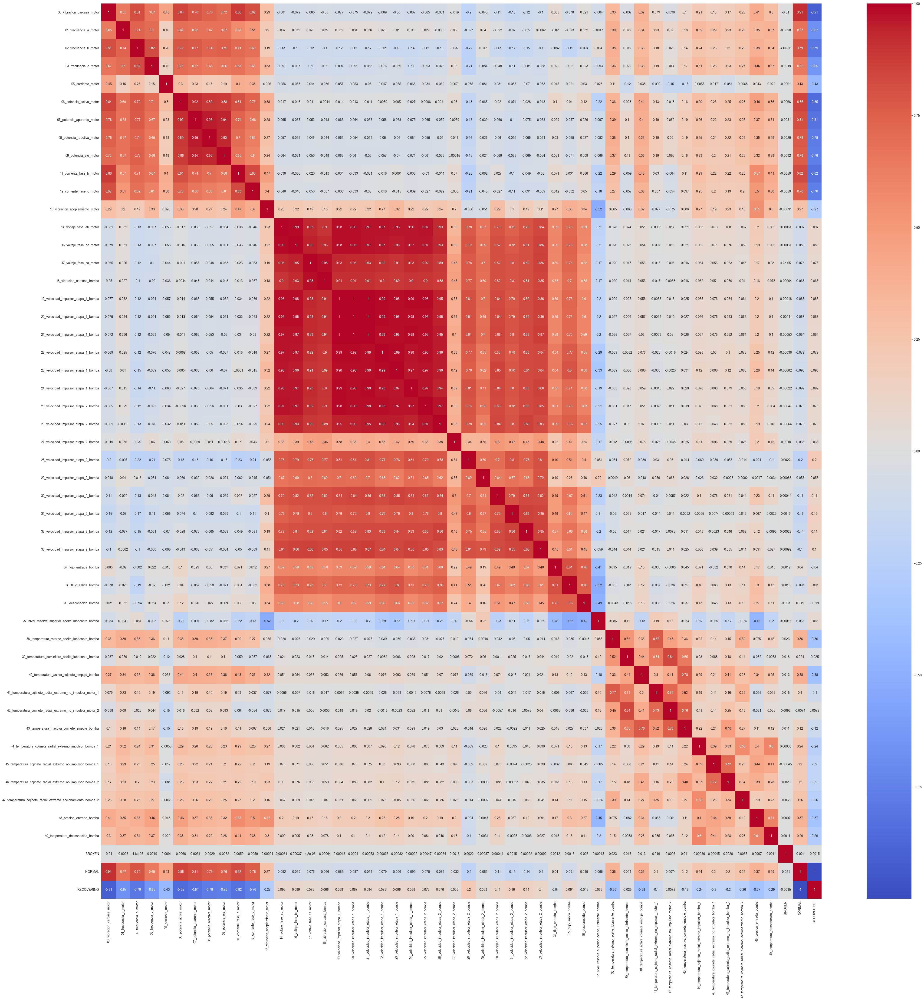

In [101]:
# Teniendo encuenta todos los estados de la bomba

corr = sensores_reducidos.corr(numeric_only=True)
fig, axes = plt.subplots(nrows = 1, ncols=1, figsize=(50, 50))
sns.heatmap(corr, annot=True, cmap='coolwarm')

# Conclusiones de los Gráficos

A partir de los gráficos, podemos hacer las siguientes observaciones clave:

1. La distribución de los valores de los sensores varía dependiendo de si la bomba está en estado 'NORMAL' o 'RECOVERING'.
2. Algunos sensores, como el sensor_50, muestran una distribución inusual que puede ser causada por el tratamiento de los valores NaN.
3. En el estado 'RECOVERING', los datos tienden a ser más dispersos, lo que podría indicar que los sensores registran lecturas más variadas cuando la bomba está en este estado.


## Histograma

Aca podemos ver que tan distribuidos se encuentran los valores de los sensores, en los puntos de mayor cantidad son los estadios de funcionamiento "NORMAL" (azul) de la bomba y en "RECUPERACION" (rojo), se puede observar que la distribucion de algunos sensores no se ve afectada por el estadio en que se encuentre, en cambio en otros se ve una fuerte diferencia.

## Grafico de cajas

Con estas graficas podemos ver que tan dispersos o concentrados estan los datos segun si la bomba se encuentra en estado "NORMAL" o estado "RECOVERING", se puede ver que en este ultimo los datos se encuentran mucho mas dispersos. Esto se puede deber a que en un estado "NORMAL" los valores de los sensores son estables, en cambio en el estado "RECOVERING" algunos sensores (por ejemplo los de vibracion) tiene  valores anormales (en vibracion cercano a 0)

## Graficos Bivariados

Los sensores del 14 al 33 tienen una muy alta correlacion esto tiene mucho sentido, ya que el voltaje y las velocidades de un motor estan muy vinculadas, el unico sensor que no tiene una alta correlacion es el 27.

# Analisis bivariado

Para este analisis utilice ciertas herramientas que hace falta comentar que son y porque las uso. Todos mis datos todos son sistemas fisicos, es decir pueden ser derivados.


**Derivada**: Calcular la derivada de una función nos ayuda a determinar la tasa de cambio en un punto específico. En el contexto de sensores, la derivada nos permite identificar rápidamente cambios abruptos o anómalos en las lecturas. Estos picos o caídas repentinas pueden ser indicativos de un problema inminente o una condición anómala.

**Media Móvil**: La media móvil suaviza los datos, lo que puede ayudar a identificar tendencias a largo plazo o patrones cíclicos que no son evidentes en los datos brutos. Al usar una media móvil de 5 horas, estamos promediando las lecturas de sensores en un intervalo de 5 horas, lo que puede ser útil para identificar tendencias a corto plazo.

Estas nuevas feature las voy a utilizar para ver cambios en la correlacion de las variables momentos antes de fallar.

##Graficos - Analsis bivariado

Voy a graficar la correlacion promedio de sensores, derivada de los sensores y media movil de los sensores; cada uno con su correlacion general y el otro con la correlacion 24hs antes de que suceda el problema, luego realizo una diferencia entre ambos para ver mas facil las mayores variaciones.

In [105]:
sensores.head()

,00_vibracion_carcasa_motor,01_frecuencia_a_motor,02_frecuencia_b_motor,03_frecuencia_c_motor,04_velocidad_motor,05_corriente_motor,06_potencia_activa_motor,07_potencia_aparente_motor,08_potencia_reactiva_motor,09_potencia_eje_motor,...,45_temperatura_cojinete_radial_extremo_no_impulsor_bomba_1,46_temperatura_cojinete_radial_extremo_no_impulsor_bomba_2,47_temperatura_cojinete_radial_extremo_accionamiento_bomba_2,48_presion_entrada_bomba,49_temperatura_desconocida_bomba,50_presion_descarga_bomba_1,51_presion_descarga_bomba_2,BROKEN,NORMAL,RECOVERING
timestamp,,,,,,,,,,,,,,,,,,,,,
2018-04-01 00:00:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889,False,True,False
2018-04-01 00:01:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889,False,True,False
2018-04-01 00:02:00,2.444734,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,15.61777,15.01013,...,65.39352,51.21528,38.194443,155.9606,67.12963,241.3194,203.7037,False,True,False
2018-04-01 00:03:00,2.460474,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,15.69734,15.08247,...,64.81481,51.21528,38.194440,155.9606,66.84028,240.4514,203.1250,False,True,False
2018-04-01 00:04:00,2.445718,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,15.69734,15.08247,...,65.10416,51.79398,38.773150,158.2755,66.55093,242.1875,201.3889,False,True,False


In [102]:
#### VER ESTA FUNCION

derivate_columns = [col for col in sensores.columns if 'derivat' in col]

# Crear un nuevo DataFrame con solo las columnas que contienen "derivate"
derivate_df = sensores[derivate_columns]

In [ ]:
derivate_df.head()

,sensor_00_derivative,sensor_01_derivative,sensor_02_derivative,sensor_03_derivative,sensor_04_derivative,sensor_05_derivative,sensor_06_derivative,sensor_07_derivative,sensor_08_derivative,sensor_09_derivative,...,sensor_42_derivative,sensor_43_derivative,sensor_44_derivative,sensor_45_derivative,sensor_46_derivative,sensor_47_derivative,sensor_48_derivative,sensor_49_derivative,sensor_50_derivative,sensor_51_derivative
timestamp,,,,,,,,,,,,,,,,,,,,,
2018-04-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-04-01 00:01:00,0.000000,0.00000,0.0000,0.000000,0.0000,0.00000,0.00000,0.00000,0.00000,0.00000,...,0.000000,0.00000,0.000000,0.00000,0.00000,0.000000,0.0000,0.00000,0.0000,0.0000
2018-04-01 00:02:00,-0.020660,0.26042,0.0000,0.086810,4.5139,-2.91377,-0.08681,-0.09403,0.05064,-0.04340,...,-0.000002,-0.26042,-0.289348,-0.28935,0.28935,0.000003,-2.0255,-0.57871,-1.7362,2.3148
2018-04-01 00:03:00,0.015740,-0.26042,-0.0434,-0.000002,-10.7639,3.44300,-0.00723,0.20978,0.07957,0.07234,...,-0.260410,-0.78125,-0.289352,-0.57871,0.00000,-0.000003,0.0000,-0.28935,-0.8680,-0.5787
2018-04-01 00:04:00,-0.014756,0.04340,0.0434,0.000000,8.3333,-0.40001,0.03617,-0.03617,0.00000,0.00000,...,0.000000,0.52084,-0.289350,0.28935,0.57870,0.578710,2.3149,-0.28935,1.7361,-1.7361


In [103]:
# Buscando los puntos donde se da la falla de la bomba

rupturas = sensores_sin_nan.loc[sensores['machine_status'] == 'BROKEN'].index

# Graficando el dataset completo

derivate_columns = [col for col in sensores_df.columns if 'derivat' in col]

# Crear un nuevo DataFrame con solo las columnas que contienen "derivate"
derivate_df = sensores_df[derivate_columns]

derivate_df.head()

fig, axes = plt.subplots(nrows = derivate_df.shape[1], ncols=1, figsize=(100, 100))

for j in derivate_df.columns:
    sns.lineplot(ax=axes[derivate_df.columns.get_loc(j)], data= derivate_df[j])
    sns.scatterplot(ax=axes[derivate_df.columns.get_loc(j)], data = derivate_df[j][rupturas], marker = 'x', s = 200, color = 'red')

NameError: name 'sensores_sin_nan' is not defined

<ipython-input-48-8976a8ac7ba0>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  general_correlation = sensores_sin_nan.corr()
<ipython-input-48-8976a8ac7ba0>:11: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  pre_failure_correlation = pre_failure_data.corr()


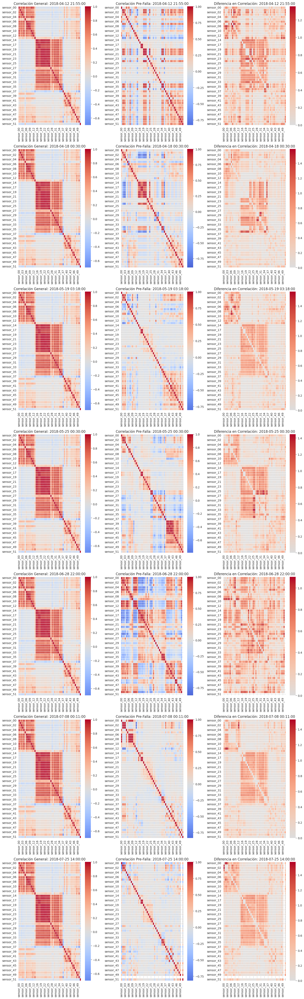

In [ ]:
general_correlation = sensores_sin_nan.corr()

# Identifica los puntos de falla
failure_points = sensores_sin_nan[sensores_sin_nan['machine_status'] == 'BROKEN']

# Definimos una función para plotear la correlación y la diferencia
def plot_correlation_difference(failure_date, ax):
    start_time = failure_date - pd.Timedelta(hours=24)
    pre_failure_data = sensores_sin_nan.loc[start_time:failure_date]

    pre_failure_correlation = pre_failure_data.corr()

    correlation_difference = abs(pre_failure_correlation - general_correlation)

    sns.heatmap(general_correlation, cmap='coolwarm', center=0, annot=False, linewidths=0.5, ax=ax[0])
    ax[0].set_title(f'Correlación General: {failure_date}')

    sns.heatmap(pre_failure_correlation, cmap='coolwarm', center=0, annot=False, linewidths=0.5, ax=ax[1])
    ax[1].set_title(f'Correlación Pre-Falla: {failure_date}')

    sns.heatmap(correlation_difference, cmap='coolwarm', center=0, annot=False, linewidths=0.5, ax=ax[2])
    ax[2].set_title(f'Diferencia en Correlación: {failure_date}')

# Ahora iteramos sobre todos los puntos de falla y ploteamos
num_failures = len(failure_points)
fig, axes = plt.subplots(nrows=num_failures, ncols=3, figsize=(15, 7 * num_failures))

# Si solo hay una falla, 'axes' no será una lista de listas, así que lo ajustamos
if num_failures == 1:
    axes = [axes]

for idx, failure_date in enumerate(failure_points.index):
    plot_correlation_difference(failure_date, axes[idx])

plt.tight_layout()
plt.show()


In [ ]:
# Calcular la derivada y media móvil para cada columna de sensor

sensores_df = sensores_sin_nan.copy()

for col in sensores_df.columns:
    if 'sensor' in col:
        # Calcular la derivada
        sensores_df[col + '_derivative'] = sensores_df[col].diff()
        # Calcular la media móvil con ventana de 5
        sensores_df[col + '_rolling_mean'] = sensores_df[col].rolling(window=5).mean()

# Mostrar las primeras filas del dataframe modificado
sensores_df.head(10)

<ipython-input-72-1e1d6c59bcf7>:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  sensores_df[col + '_derivative'] = sensores_df[col].diff()
<ipython-input-72-1e1d6c59bcf7>:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  sensores_df[col + '_rolling_mean'] = sensores_df[col].rolling(window=5).mean()
<ipython-input-72-1e1d6c59bcf7>:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.conca

,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,...,sensor_47_derivative,sensor_47_rolling_mean,sensor_48_derivative,sensor_48_rolling_mean,sensor_49_derivative,sensor_49_rolling_mean,sensor_50_derivative,sensor_50_rolling_mean,sensor_51_derivative,sensor_51_rolling_mean
timestamp,,,,,,,,,,,,,,,,,,,,,
2018-04-01 00:00:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-04-01 00:01:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,0.000000,NaN,0.0000,NaN,0.00000,NaN,0.0000,NaN,0.0000,NaN
2018-04-01 00:02:00,2.444734,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,15.61777,15.01013,...,0.000003,NaN,-2.0255,NaN,-0.57871,NaN,-1.7362,NaN,2.3148,NaN
2018-04-01 00:03:00,2.460474,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,15.69734,15.08247,...,-0.000003,NaN,0.0000,NaN,-0.28935,NaN,-0.8680,NaN,-0.5787,NaN
2018-04-01 00:04:00,2.445718,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,15.69734,15.08247,...,0.578710,38.310183,2.3149,157.23378,-0.28935,67.187504,1.7361,242.01390,-1.7361,202.19908
2018-04-01 00:05:00,2.453588,47.09201,53.1684,46.397568,637.6157,78.18568,13.41146,16.16753,15.89265,15.16204,...,0.000000,38.425925,6.3657,158.56480,0.00000,66.956022,-0.5787,241.72454,0.2893,202.25694
2018-04-01 00:06:00,2.455556,47.04861,53.1684,46.397568,633.3333,75.81614,13.43316,16.13136,15.65393,15.08247,...,0.289350,38.599537,7.2338,161.34258,1.15741,66.956022,-1.4468,241.14582,-1.4467,202.02546
2018-04-01 00:07:00,2.449653,47.13541,53.1684,46.397568,630.6713,75.77331,13.25231,16.12413,16.19647,15.08247,...,0.289350,38.831018,6.6551,165.85648,0.86805,67.245374,1.1574,241.14582,0.8680,201.50462
2018-04-01 00:08:00,2.463426,47.09201,53.1684,46.397568,631.9444,74.58916,13.28848,16.13136,15.47309,15.11863,...,0.000000,39.062500,3.4722,171.06482,0.86805,67.766206,1.7362,241.66666,0.5787,201.21526


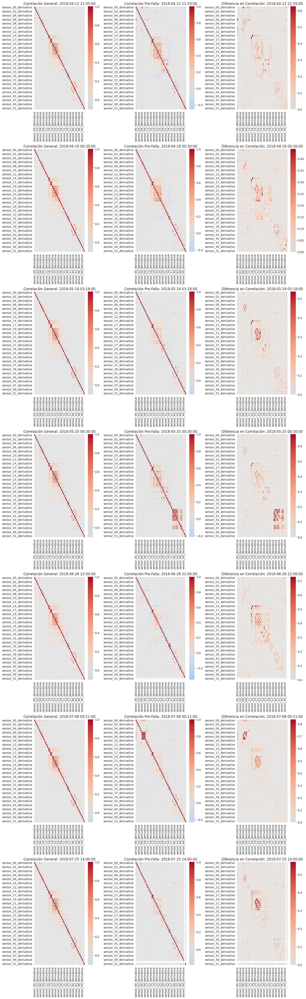

In [ ]:
derivate_columns = [col for col in sensores_df.columns if 'derivat' in col]

# Crear un nuevo DataFrame con solo las columnas que contienen "derivate"
derivate_df = sensores_df[derivate_columns]

general_correlation = derivate_df.corr()


# Identifica los puntos de falla
failure_points = sensores_df[sensores_df['machine_status'] == 'BROKEN']

# Definimos una función para plotear la correlación y la diferencia
def plot_correlation_difference(failure_date, ax):
    start_time = failure_date - pd.Timedelta(hours=24)
    pre_failure_data = derivate_df.loc[start_time:failure_date]

    pre_failure_correlation = pre_failure_data.corr()

    correlation_difference = abs(pre_failure_correlation - general_correlation)

    sns.heatmap(general_correlation, cmap='coolwarm', center=0, annot=False, linewidths=0.5, ax=ax[0])
    ax[0].set_title(f'Correlación General: {failure_date}')

    sns.heatmap(pre_failure_correlation, cmap='coolwarm', center=0, annot=False, linewidths=0.5, ax=ax[1])
    ax[1].set_title(f'Correlación Pre-Falla: {failure_date}')

    sns.heatmap(correlation_difference, cmap='coolwarm', center=0, annot=False, linewidths=0.5, ax=ax[2])
    ax[2].set_title(f'Diferencia en Correlación: {failure_date}')

# Ahora iteramos sobre todos los puntos de falla y ploteamos
num_failures = len(failure_points)
fig, axes = plt.subplots(nrows=num_failures, ncols=3, figsize=(15, 7 * num_failures))

# Si solo hay una falla, 'axes' no será una lista de listas, así que lo ajustamos
if num_failures == 1:
    axes = [axes]

for idx, failure_date in enumerate(failure_points.index):
    plot_correlation_difference(failure_date, axes[idx])

plt.tight_layout()
plt.show()

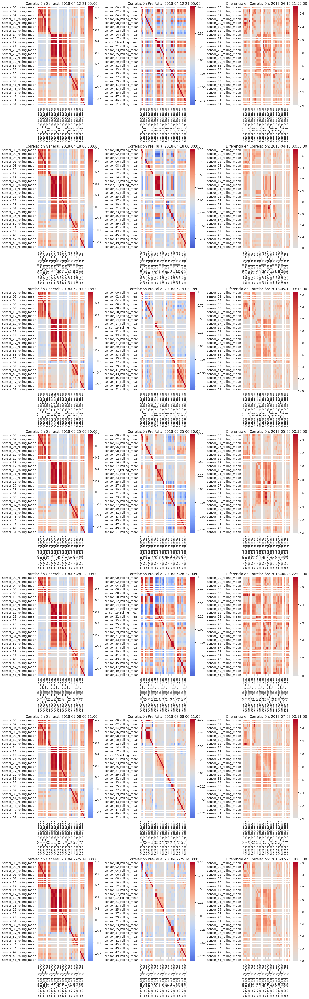

In [ ]:
derivate_columns = [col for col in sensores_df.columns if 'rolli' in col]

# Crear un nuevo DataFrame con solo las columnas que contienen "derivate"
derivate_df = sensores_df[derivate_columns]

general_correlation = derivate_df.corr()


# Identifica los puntos de falla
failure_points = sensores_df[sensores_df['machine_status'] == 'BROKEN']

# Definimos una función para plotear la correlación y la diferencia
def plot_correlation_difference(failure_date, ax):
    start_time = failure_date - pd.Timedelta(hours=24)
    pre_failure_data = derivate_df.loc[start_time:failure_date]

    pre_failure_correlation = pre_failure_data.corr()

    correlation_difference = abs(pre_failure_correlation - general_correlation)

    sns.heatmap(general_correlation, cmap='coolwarm', center=0, annot=False, linewidths=0.5, ax=ax[0])
    ax[0].set_title(f'Correlación General: {failure_date}')

    sns.heatmap(pre_failure_correlation, cmap='coolwarm', center=0, annot=False, linewidths=0.5, ax=ax[1])
    ax[1].set_title(f'Correlación Pre-Falla: {failure_date}')

    sns.heatmap(correlation_difference, cmap='coolwarm', center=0, annot=False, linewidths=0.5, ax=ax[2])
    ax[2].set_title(f'Diferencia en Correlación: {failure_date}')

# Ahora iteramos sobre todos los puntos de falla y ploteamos
num_failures = len(failure_points)
fig, axes = plt.subplots(nrows=num_failures, ncols=3, figsize=(15, 7 * num_failures))

# Si solo hay una falla, 'axes' no será una lista de listas, así que lo ajustamos
if num_failures == 1:
    axes = [axes]

for idx, failure_date in enumerate(failure_points.index):
    plot_correlation_difference(failure_date, axes[idx])

plt.tight_layout()
plt.show()

##Conclusiones

Si bien no se que tan preciso sea el analisis que realice, me parecio interesante que hay gran variacion de las correlaciones entre los sensores del 14 al 37 aproximadamante. A esto le veo sentido, ya que del 19 al 33 son sensores de distintos puntos de las etapas de impulsion del equipo, estas variaciones podrian utilizarse para predecir alguna posible falla del equipo.

Por otro lado, las derivadas, aunque no ofrecen una
imagen clara a primera vista, muestran variaciones
notables durante los fallos. Un cambio brusco en
las variables se traduce en una derivada elevada, lo
que refuerza su utilidad como indicador temprano.

# Preguntas e Hipótesis

Basándonos en nuestro análisis hasta ahora, planteamos las siguientes preguntas e hipótesis:

1. ¿La bomba da algún tipo de "aviso" antes de fallar? Por ejemplo, ¿podemos ver alguna anomalía en las lecturas de los sensores antes de que ocurra una falla?
2. ¿Podemos clasificar las fallas de la bomba en diferentes categorías, como fallas eléctricas o mecánicas, basándonos en las lecturas de los sensores?
3. ¿Podemos predecir una falla futura de la bomba basándonos en las lecturas de los sensores?

Estas preguntas nos ayudarán a guiar el resto de nuestro análisis y a determinar qué tipo de modelos de machine learning podrían ser útiles.


### Hipotesis 1 - ¿La bomba da algun tipo de "aviso" antes de fallar?

Observando como varian las media de los sensores momentos antes de que ocurra el fallo, quiero descubrir si es posible detecetar algun tipo de aviso del equipo anteas de fallar. Para esto lo que hice fue comparar las medias de dos ventanas de tiempo antes que fallen (1h y 24h en este caso) para cada fallo que ocurrio, luego obtengo las variaciones de estas medias y como ultimo paso realice una diferencia entre las dos ventanas de tiempo, esto es para ver si el posible aviso se da en poco o en mucho tiempo.

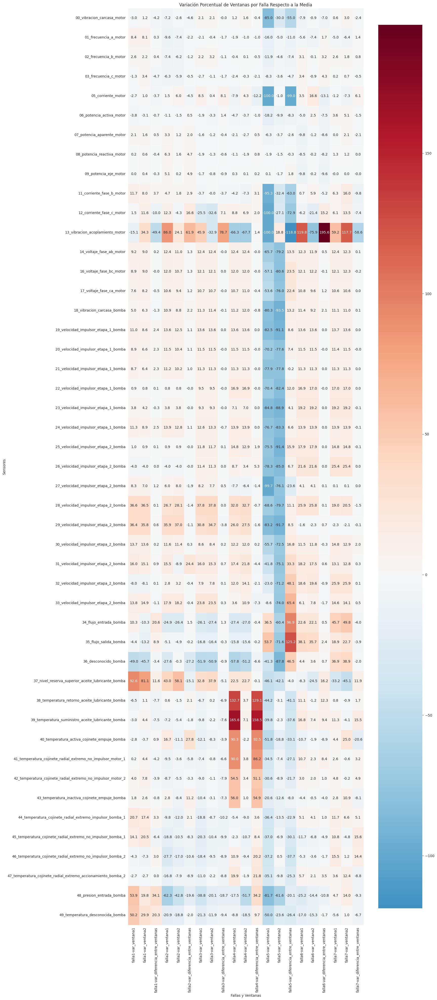

In [ ]:
analisis_sensores(sensores_reducidos, ventana1=60, ventana2=1440, tiempo_antes=2)

Luego de este analisis se pudo ver que el equipo tuvo un funcionamiento anormal momentos antes de que ocurran las fallas, eso se puede ver por las desviaciones de los sensores respectos de la media de los mismos. Se podria analizar si el funcionamiento provoco la falla o si la falla provoco el mal funcionamiento, pero por la restriccion que tenemos (solo conocemos los datos de los sensores, no tenemos datos del ambiente en el que se encontraba) esto no puede ser realizado.

### Hipotesis 2 - ¿Es posible clasificar las fallas?

La falla si podria ser categorizada por ejemplo.

En el fallo uno podemos ver que los siguientes sensores:

SENSOR_37 - Nivel de reserva superior del aceite lubricante de la bomba.

SENSOR_48 - Presión de entrada de la bomba.

SENSOR_49 - Temperatura desconocida de la bomba

nos dan valores atipicos, considerando que los niveles de aceite de la bomba tienen una limitacion superior (ya que este se volcaria) podemos decir que una causa probable pudo haber sido algo que bloqueo la entrada de la bomba, provocando una alta presion y provocando el fallo. El sensor de temperatura de la bomba no conocido su posicion tambien puede indicar un fallo mecanico o que esta sobrepresion calento el aceite (a mayor presion, mayor temperatura).


Por otro lado en la falla 5 podemos ver una variacion interesante de las corrientes

SENSOR_05 - Corriente del motor

SENSOR_10 - Corriente de fase A del motor

SENSOR_11 - Corriente de fase B del motor

SENSOR_12 - Corriente de fase C del motor

podria indicar un fallo electrico en la bomba.

-----
Podemos detectar donde se dio el fallo pero conocer la causa raiz es un proceso que necesita de mas analisis y de un conocimiento exhaustivo del equipo.

### Hipotesis 3 - ¿Se puede predecir una falla futura?

Esta hipotesis es el porque elegi este dataset para analizar, sera abordada en el transcurso del proyecto.

# Modelos de Machine Learning

En esta sección, entrenamos varios modelos de machine learning para predecir si la bomba fallará o no basándonos en las lecturas de los sensores. Comparamos modelos de Regresión Logística, Árbol de Decisión y Naive Bayes. Los resultados de cada modelo se evalúan en función de varias métricas, como la precisión, la sensibilidad y la especificidad.

Para cada modelo, primero realizamos una selección de características para identificar las lecturas de los sensores más relevantes para predecir las fallas de la bomba. Luego, dividimos nuestros datos en un conjunto de entrenamiento y un conjunto de prueba, entrenamos el modelo en el conjunto de entrenamiento y evaluamos su rendimiento en el conjunto de prueba.


### Seleccion de dimensiones

In [35]:
# Seleccion de caracteristicas relevantes

sensores_reducidos_normal = sensores_reducidos.copy()
sensores_reducidos_normal = sensores_reducidos_normal.loc[sensores_reducidos_normal['RECOVERING'] != 1]

X = sensores_reducidos_normal.drop(['BROKEN','RECOVERING','NORMAL'], axis=1, inplace=False)
y = sensores_reducidos_normal['BROKEN']

stepwise_sel = stepwise_selection(X,y)

In [36]:
# Caracteriticas relevantes

print('Aplicando la eliminación bidireccional quedaron: ' + str(len(stepwise_sel)) + ' columnas y estas son:')
print(stepwise_sel)

Aplicando la eliminación bidireccional quedaron: 18 columnas y estas son:
['38_temperatura_retorno_aceite_lubricante_bomba', '40_temperatura_activa_cojinete_empuje_bomba', '06_potencia_activa_motor', '37_nivel_reserva_superior_aceite_lubricante_bomba', '48_presion_entrada_bomba', '05_corriente_motor', '02_frecuencia_b_motor', '01_frecuencia_a_motor', '09_potencia_eje_motor', '35_flujo_salida_bomba', '36_desconocido_bomba', '03_frecuencia_c_motor', '44_temperatura_cojinete_radial_extremo_impulsor_bomba_1', '11_corriente_fase_b_motor', '39_temperatura_suministro_aceite_lubricante_bomba', '42_temperatura_cojinete_radial_extremo_no_impulsor_motor_2', '41_temperatura_cojinete_radial_extremo_no_impulsor_motor_1', '29_velocidad_impulsor_etapa_2_bomba']


### Particion del dataset en Train y Test y aplicacion de SMOTE

In [37]:
# Particiono el dataset para que me queden de manera equilibrada la cantidad de datos BROKEN con reduccion de dimensiones

X_train, X_test, y_train, y_test = train_test_split(X[sorted(stepwise_sel)], y, test_size=0.3, random_state=2, stratify=y)

print('La cantidad de BROKEN en la data de entrenamiento con reduccion de dimensiones es de: ' + str(y_train.sum()) + ' y en la data de test es de : ' + str(y_test.sum()))

# Particiono el dataset para que me queden de manera equilibrada la cantidad de datos BROKEN sin reduccion de dimensiones

X1_train, X1_test, y1_train, y1_test = train_test_split(X, y, test_size=0.3, random_state=2, stratify=y)

print('La cantidad de BROKEN en la data de entrenamiento sin reduccion de dimensiones es de: ' + str(y_train.sum()) + ' y en la data de test es de : ' + str(y_test.sum()))

La cantidad de BROKEN en la data de entrenamiento con reduccion de dimensiones es de: 5 y en la data de test es de : 2
La cantidad de BROKEN en la data de entrenamiento sin reduccion de dimensiones es de: 5 y en la data de test es de : 2


In [38]:
# Aplico SMOTE para 3 distintas cantidades de sobremuestreos (200,2000,20000) y luego grafico con reduccion de dimensiones

data_sobremuestrada = smote_comparison(X_train, y_train, oversample_options=[200, 2000, 20000])

In [39]:
# Aplico SMOTE para 3 distintas cantidades de sobremuestreos (200,2000,20000) y luego grafico con reduccion de dimensiones

data_sobremuestrada1 = smote_comparison(X1_train, y1_train, oversample_options=[200, 2000, 20000])

## Aplicacion de modelos

### Arbol de decisiones

Realizo dos graficas para ver en la primera la tabla de verdad y en el siguiente quiero ver si los valores detectados como Falsos positivos estaban cerca del momento de falla del equipo

El accuracy es: 0.9999676129094943
La precisión positiva es: 0.0 y la negativa es: 0.9999676129094943
El recall de sensibilidad es: 0.0 y el recall de especificidad es: 1.0
El f1 positivo es: 0.0 y el f1 negativo es: 0.999983806192512


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



<Figure size 1000x600 with 0 Axes>

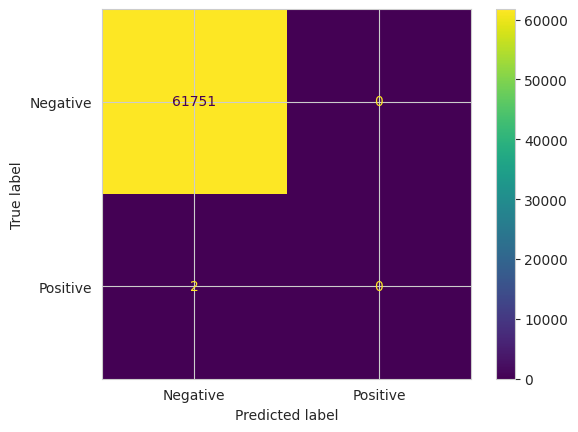

In [ ]:
# Arbol de dicisiones con reduccion de dimensiones

preds_RDF = evaluar_modelo_RFC(X_train, X_test, y_train, y_test)

El accuracy es: 0.9999676129094943
La precisión positiva es: 0.0 y la negativa es: 0.9999676129094943
El recall de sensibilidad es: 0.0 y el recall de especificidad es: 1.0
El f1 positivo es: 0.0 y el f1 negativo es: 0.999983806192512


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



<Figure size 1000x600 with 0 Axes>

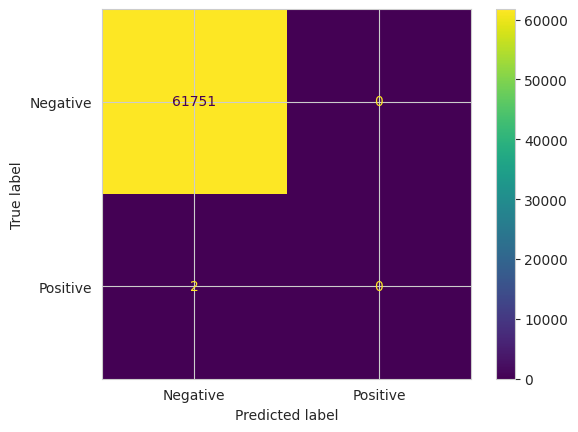

In [ ]:
# Arbol de dicisiones sin reduccion de dimensiones

preds_RDF1 = evaluar_modelo_RFC(X1_train, X1_test, y1_train, y1_test)

El accuracy es: 0.9999514193642414
La precisión positiva es: 0.0 y la negativa es: 0.999967612385024
El recall de sensibilidad es: 0.0 y el recall de especificidad es: 0.9999838059302684
El f1 positivo es: 0.0 y el f1 negativo es: 0.9999757090920869


<Figure size 1000x600 with 0 Axes>

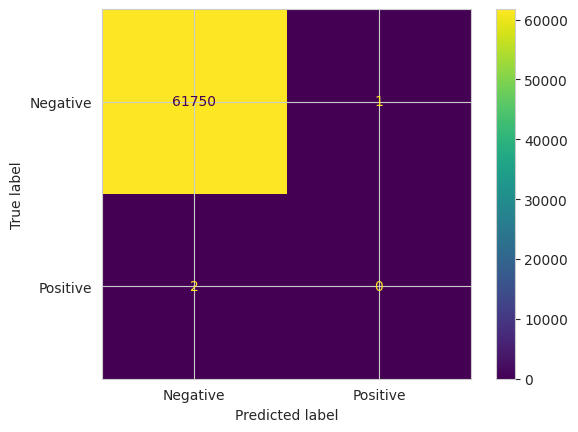

In [ ]:
# Arbol de decisiones con reduccion de dimensiones y SMOTE

preds_RDF_sob200 = evaluar_modelo_RFC(data_sobremuestrada[200][0], X_test, data_sobremuestrada[200][1], y_test)

El accuracy es: 0.9999514193642414
La precisión positiva es: 0.0 y la negativa es: 0.999967612385024
El recall de sensibilidad es: 0.0 y el recall de especificidad es: 0.9999838059302684
El f1 positivo es: 0.0 y el f1 negativo es: 0.9999757090920869


<Figure size 1000x600 with 0 Axes>

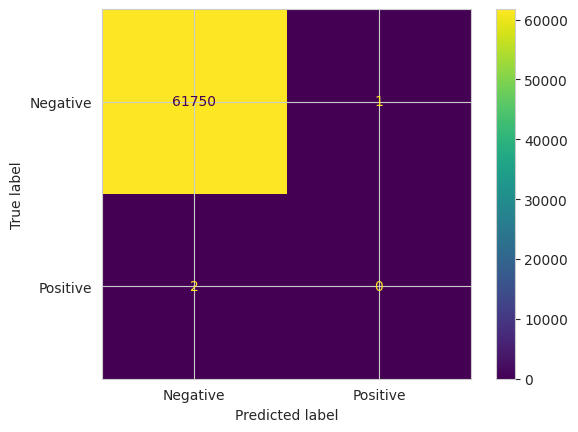

In [ ]:
# Arbol de decisiones con reduccion de dimensiones y sobremuestreo de 20000

preds_RDF_sob20000 = evaluar_modelo_RFC(data_sobremuestrada[20000][0], X_test, data_sobremuestrada[20000][1], y_test)

El accuracy es: 0.9999676129094943
La precisión positiva es: 0.0 y la negativa es: 0.9999676129094943
El recall de sensibilidad es: 0.0 y el recall de especificidad es: 1.0
El f1 positivo es: 0.0 y el f1 negativo es: 0.999983806192512


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



<Figure size 1000x600 with 0 Axes>

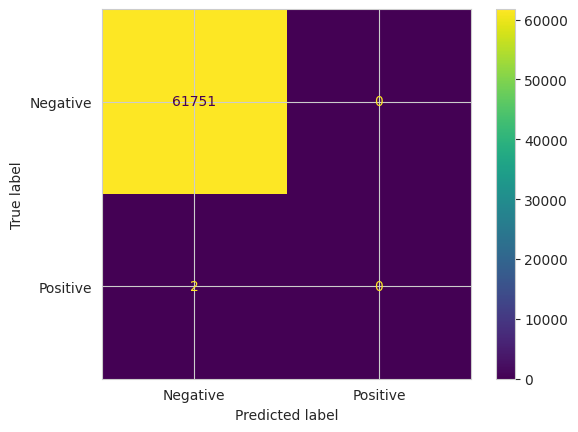

In [ ]:
# Arbol de decisiones sin reduccion de dimensiones y sobremuestreo de 20000

preds_RDF1_sob20000 = evaluar_modelo_RFC(data_sobremuestrada1[20000][0], X1_test, data_sobremuestrada1[20000][1], y1_test)

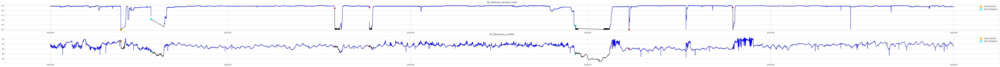

In [ ]:
plot_sensors(sensores_reducidos[sensores_reducidos.columns[0:2].tolist() + ['NORMAL','RECOVERING','BROKEN']],  preds_RDF_sob20000)

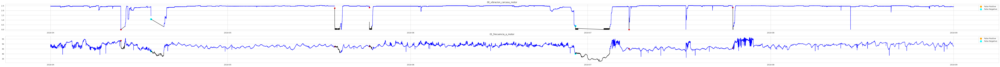

In [ ]:
plot_sensors(sensores_reducidos[sensores_reducidos.columns[0:2].tolist() + ['NORMAL','RECOVERING','BROKEN']],  preds_RDF1_sob20000)

### Regresion logistica

El accuracy es: 0.9999676129094943
La precisión positiva es: 0.0 y la negativa es: 0.9999676129094943
El recall de sensibilidad es: 0.0 y el recall de especificidad es: 1.0
El f1 positivo es: 0.0 y el f1 negativo es: 0.999983806192512


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



<Figure size 1000x600 with 0 Axes>

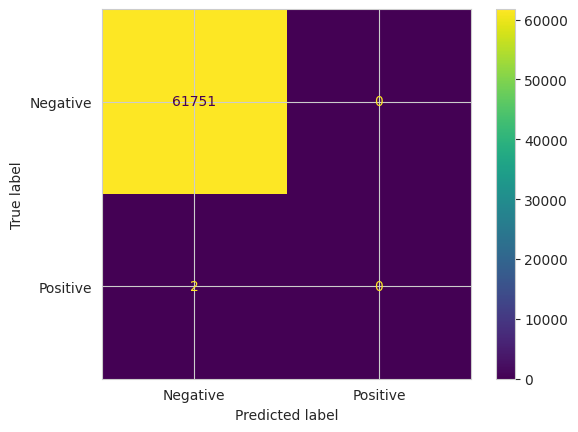

In [ ]:
# Regresion Logistica con reduccion de dimensiones

preds_RL = evaluar_modelo_logistica(X_train, X_test, y_train, y_test)

El accuracy es: 0.9999514193642414
La precisión positiva es: 0.0 y la negativa es: 0.999967612385024
El recall de sensibilidad es: 0.0 y el recall de especificidad es: 0.9999838059302684
El f1 positivo es: 0.0 y el f1 negativo es: 0.9999757090920869


<Figure size 1000x600 with 0 Axes>

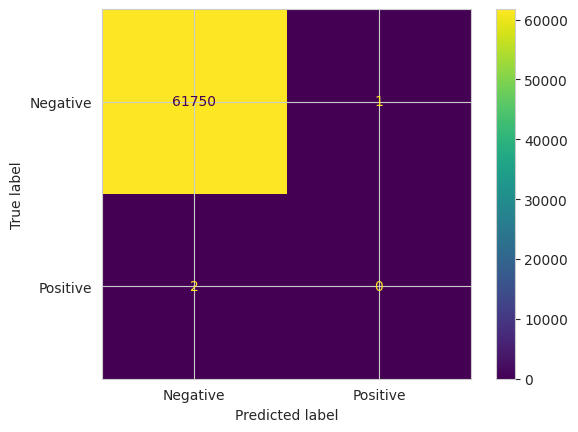

In [ ]:
# Regresion Logistica sin reduccion de dimensiones

preds_RL1 = evaluar_modelo_logistica(X1_train, X1_test, y1_train, y1_test)

El accuracy es: 0.9996275484591842
La precisión positiva es: 0.0 y la negativa es: 0.9999676018920495
El recall de sensibilidad es: 0.0 y el recall de especificidad es: 0.999659924535635
El f1 positivo es: 0.0 y el f1 negativo es: 0.9998137395430949


<Figure size 1000x600 with 0 Axes>

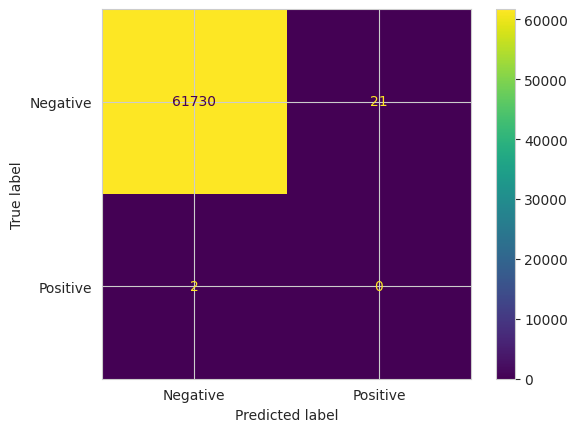

In [ ]:
# Regresion logistica con reduccion de dimensiones y sobremuestreo de 200


preds_RL_sob200 = evaluar_modelo_logistica(data_sobremuestrada[200][0], X_test, data_sobremuestrada[200][1], y_test)

El accuracy es: 0.996356452318106
La precisión positiva es: 0.0 y la negativa es: 0.9999674955306355
El recall de sensibilidad es: 0.0 y el recall de especificidad es: 0.9963887224498389
El f1 positivo es: 0.0 y el f1 negativo es: 0.9981749012418784


<Figure size 1000x600 with 0 Axes>

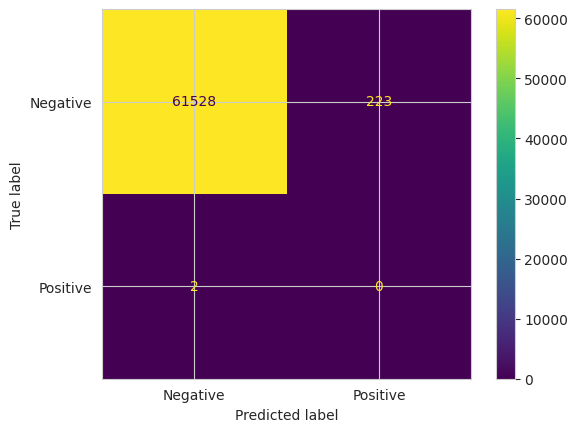

In [ ]:
# Regresion logistica con reduccion de dimensiones y sobremuestreo de 2000


preds_RL_sob2000 = evaluar_modelo_logistica(data_sobremuestrada[2000][0], X_test, data_sobremuestrada[2000][1], y_test)

El accuracy es: 0.966382200055058
La precisión positiva es: 0.0004816955684007707 y la negativa es: 0.9999832431254922
El recall de sensibilidad es: 0.5 y el recall de especificidad es: 0.9663973053067967
El f1 positivo es: 0.0009624639076034649 y el f1 negativo es: 0.9829034489574069


<Figure size 1000x600 with 0 Axes>

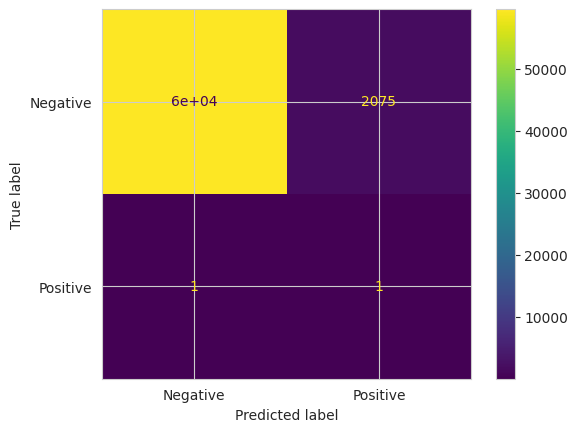

In [ ]:
# Regresion logistica con reduccion de dimensiones y sobremuestreo de 20000

preds_RL_sob20000 = evaluar_modelo_logistica(data_sobremuestrada[20000][0], X_test, data_sobremuestrada[20000][1], y_test)

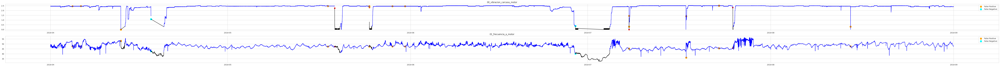

In [ ]:
plot_sensors(sensores_reducidos[sensores_reducidos.columns[0:2].tolist() + ['NORMAL','RECOVERING','BROKEN']], preds_RL_sob200)

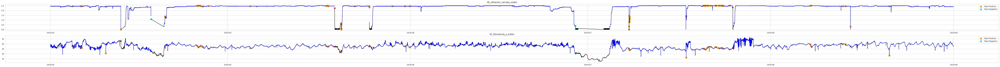

In [ ]:
plot_sensors(sensores_reducidos[sensores_reducidos.columns[0:2].tolist() + ['NORMAL','RECOVERING','BROKEN']],  preds_RL_sob2000)

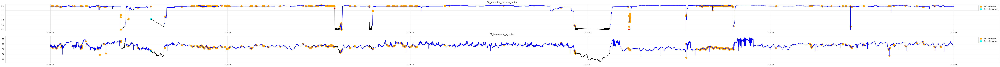

In [ ]:
plot_sensors(sensores_reducidos[sensores_reducidos.columns[0:2].tolist() + ['NORMAL','RECOVERING','BROKEN']],  preds_RL_sob20000)

### Modelo de Naive Bayes

In [ ]:
X4_train,X4_test,y4_train,y4_test = train_test_split(X, y, test_size=0.2,random_state=2)

# Crear el modelo de Naive Bayes
modelo4 = GaussianNB()

# Entrenar el modelo con los datos de entrenamiento
modelo4.fit(X4_train, y4_train)

# Ahora, el modelo está entrenado. Podemos predecir los valores para los datos de prueba
preds4 = modelo4.predict(X4_test)

In [ ]:
confusion4 = metrics.confusion_matrix(y4_test, preds4)
accuracy4 = metrics.accuracy_score(y4_test, preds4)
print("El accuracy es: ", str(accuracy4))
precision_positiva = metrics.precision_score(y4_test, preds4, pos_label=1)
precision_negativa = metrics.precision_score(y4_test, preds4, pos_label=0)
print("La precisicion positiva es: ", str(precision_positiva), " y la negativa es: ", str(precision_negativa))
recall_sensibilidad = metrics.recall_score(y4_test, preds4, pos_label=1)
recall_especificidad= metrics.recall_score(y4_test, preds4, pos_label=0)
print("El recall de sensibilidad es: ", str(recall_sensibilidad), " y el recall de especifidad es: ", str(recall_especificidad))
f1_positivo = metrics.f1_score(y4_test, preds4, pos_label=1)
f1_negativo = metrics.f1_score(y4_test, preds4, pos_label=0)
print("El f1 positivo es: ", str(f1_positivo), " y el f1 negativo es: ", str(f1_negativo))

El accuracy es:  0.9371141975308642
La precisicion positiva es:  0.0  y la negativa es:  0.9999757834067904
El recall de sensibilidad es:  0.0  y el recall de especifidad es:  0.9371354651294737
El f1 positivo es:  0.0  y el f1 negativo es:  0.9675363473411671


<Figure size 1000x600 with 0 Axes>

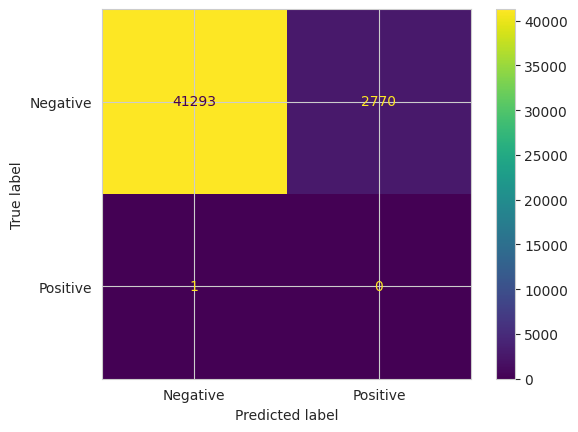

In [ ]:
plt.figure(figsize=(10,6))
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion4, display_labels = ['Negative', 'Positive'])
cm_display.plot()
plt.show()

### Redes neuronales

Epoch 1/30
4503/4503 [==============================] - 15s 3ms/step - loss: 0.0073 - accuracy: 0.9997 - val_loss: 0.0024 - val_accuracy: 1.0000
Epoch 2/30
4503/4503 [==============================] - 12s 3ms/step - loss: 0.0022 - accuracy: 0.9999 - val_loss: 0.0023 - val_accuracy: 1.0000
Epoch 3/30
4503/4503 [==============================] - 10s 2ms/step - loss: 0.0014 - accuracy: 0.9999 - val_loss: 0.0017 - val_accuracy: 1.0000
Epoch 4/30
4503/4503 [==============================] - 9s 2ms/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 0.0014 - val_accuracy: 1.0000
Epoch 5/30
4503/4503 [==============================] - 11s 2ms/step - loss: 0.0011 - accuracy: 0.9999 - val_loss: 0.0013 - val_accuracy: 1.0000
Epoch 6/30
4503/4503 [==============================] - 10s 2ms/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 0.0014 - val_accuracy: 1.0000
Epoch 7/30
4503/4503 [==============================] - 10s 2ms/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 0.0014 - val_acc

C:\Users\Lucho\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



<Figure size 1000x600 with 0 Axes>

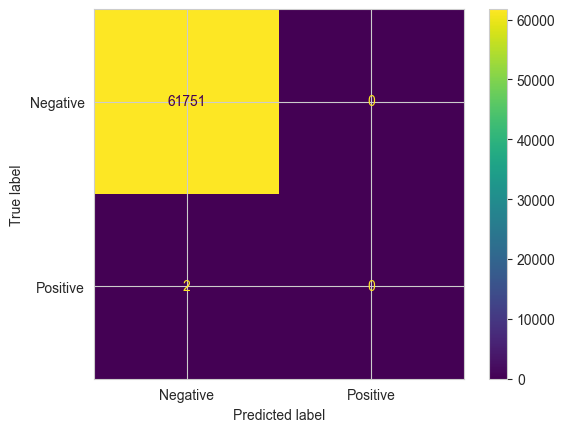

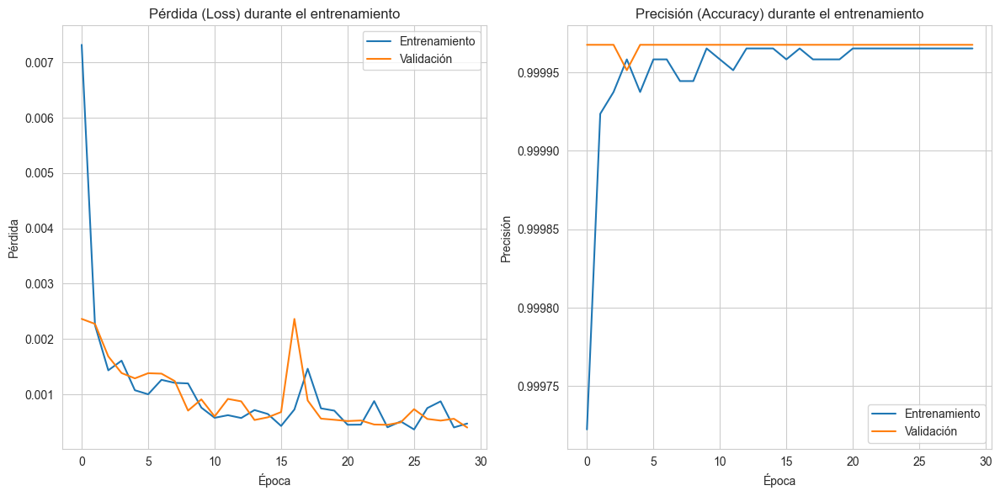

In [40]:
model_RN, preds_RN = evaluar_red_neuronal_viz(X_train, y_train, X_test, y_test, epochs=30, batch_size=32)

Epoch 1/30
7628/7628 [==============================] - 16s 2ms/step - loss: 0.0898 - accuracy: 0.9842 - val_loss: 0.1590 - val_accuracy: 0.9572
Epoch 2/30
7628/7628 [==============================] - 14s 2ms/step - loss: 0.0233 - accuracy: 0.9935 - val_loss: 0.0243 - val_accuracy: 0.9935
Epoch 3/30
7628/7628 [==============================] - 14s 2ms/step - loss: 0.0156 - accuracy: 0.9957 - val_loss: 0.0342 - val_accuracy: 0.9911
Epoch 4/30
7628/7628 [==============================] - 14s 2ms/step - loss: 0.0138 - accuracy: 0.9965 - val_loss: 0.0157 - val_accuracy: 0.9964
Epoch 5/30
7628/7628 [==============================] - 14s 2ms/step - loss: 0.0096 - accuracy: 0.9976 - val_loss: 0.0073 - val_accuracy: 0.9989
Epoch 6/30
7628/7628 [==============================] - 14s 2ms/step - loss: 0.0090 - accuracy: 0.9977 - val_loss: 0.0057 - val_accuracy: 0.9993
Epoch 7/30
7628/7628 [==============================] - 14s 2ms/step - loss: 0.0081 - accuracy: 0.9979 - val_loss: 0.0063 - val_ac

<Figure size 1000x600 with 0 Axes>

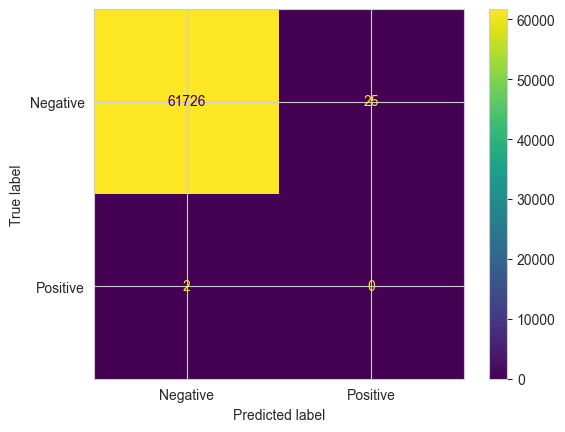

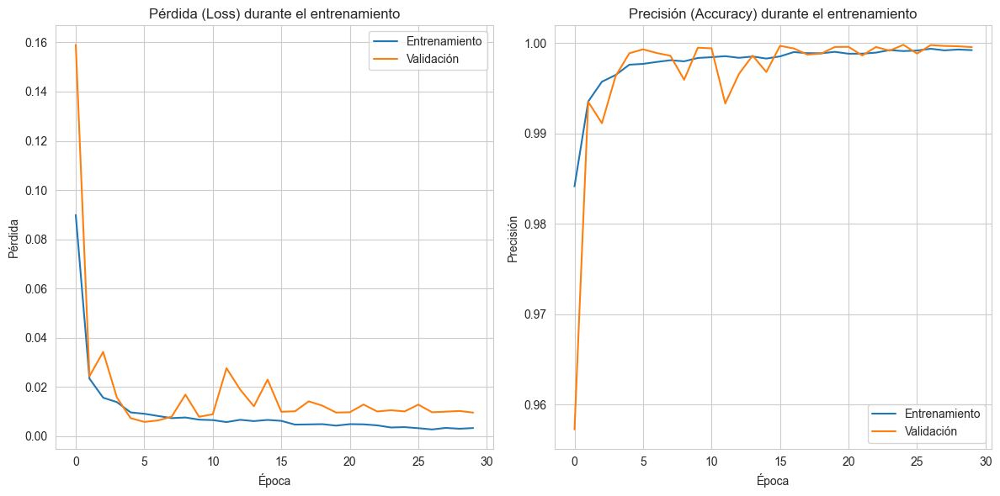

In [41]:
model_RN_sob20000, preds_RN_sob20000 = evaluar_red_neuronal_viz(data_sobremuestrada[20000][0], data_sobremuestrada[20000][1], X_test, y_test, epochs=30, batch_size=32)

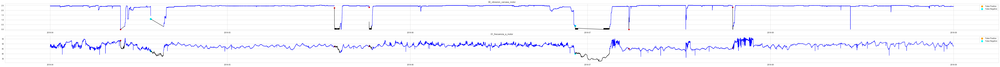

In [42]:
plot_sensors(sensores_reducidos[sensores_reducidos.columns[0:2].tolist() + ['NORMAL','RECOVERING','BROKEN']], preds_RN)

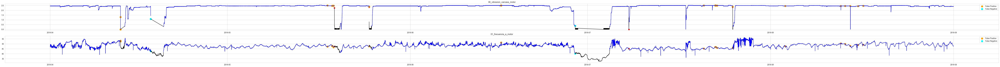

In [43]:
plot_sensors(sensores_reducidos[sensores_reducidos.columns[0:2].tolist() + ['NORMAL','RECOVERING','BROKEN']], preds_RN_sob20000)

Epoch 1/20
7628/7628 [==============================] - 18s 2ms/step - loss: 1.1292 - accuracy: 0.9592 - val_loss: 0.0360 - val_accuracy: 0.9939
Epoch 2/20
7628/7628 [==============================] - 20s 3ms/step - loss: 0.0575 - accuracy: 0.9876 - val_loss: 0.1983 - val_accuracy: 0.9558
Epoch 3/20
7628/7628 [==============================] - 18s 2ms/step - loss: 0.0292 - accuracy: 0.9920 - val_loss: 0.0072 - val_accuracy: 0.9984
Epoch 4/20
7628/7628 [==============================] - 16s 2ms/step - loss: 0.0238 - accuracy: 0.9934 - val_loss: 0.0622 - val_accuracy: 0.9812
Epoch 5/20
7628/7628 [==============================] - 15s 2ms/step - loss: 0.0198 - accuracy: 0.9947 - val_loss: 0.0121 - val_accuracy: 0.9969
Epoch 6/20
7628/7628 [==============================] - 15s 2ms/step - loss: 0.0157 - accuracy: 0.9961 - val_loss: 0.0091 - val_accuracy: 0.9980
Epoch 7/20
7628/7628 [==============================] - 15s 2ms/step - loss: 0.0140 - accuracy: 0.9968 - val_loss: 0.0082 - val_ac

<Figure size 1000x600 with 0 Axes>

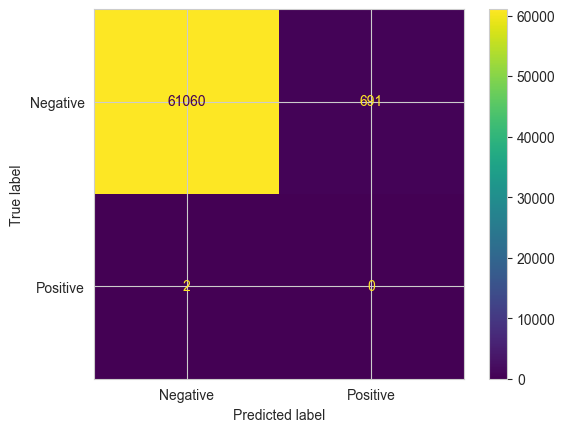

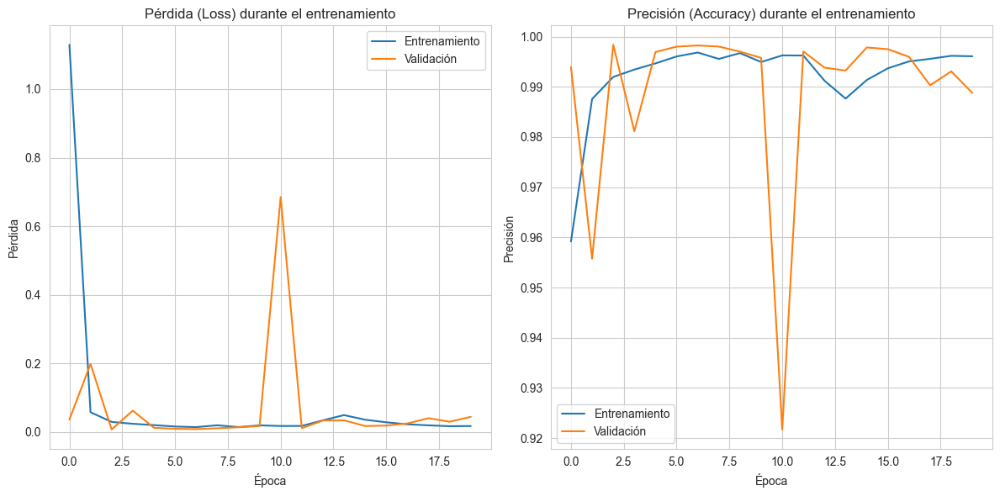

In [44]:
model_RN1_sob20000, preds_RN1_sob20000 = evaluar_red_neuronal_viz(data_sobremuestrada1[20000][0], data_sobremuestrada1[20000][1], X1_test, y1_test, epochs=20, batch_size=32)

Epoch 1/7
7628/7628 [==============================] - 15s 2ms/step - loss: 0.1201 - accuracy: 0.9620 - val_loss: 0.0304 - val_accuracy: 0.9887
Epoch 2/7
7628/7628 [==============================] - 14s 2ms/step - loss: 0.0333 - accuracy: 0.9896 - val_loss: 0.0151 - val_accuracy: 0.9951
Epoch 3/7
7628/7628 [==============================] - 15s 2ms/step - loss: 0.0209 - accuracy: 0.9939 - val_loss: 0.0062 - val_accuracy: 0.9984
Epoch 4/7
7628/7628 [==============================] - 16s 2ms/step - loss: 0.0189 - accuracy: 0.9939 - val_loss: 0.0092 - val_accuracy: 0.9978
Epoch 5/7
7628/7628 [==============================] - 17s 2ms/step - loss: 0.0525 - accuracy: 0.9901 - val_loss: 0.0074 - val_accuracy: 0.9983
Epoch 6/7
7628/7628 [==============================] - 16s 2ms/step - loss: 0.0222 - accuracy: 0.9935 - val_loss: 0.1097 - val_accuracy: 0.9694
Epoch 7/7
1930/1930 [==============================] - 2s 1ms/step
Accuracy: 0.9962592910465888
Precision: 0.0
Recall: 0.0
F1 Score: 0.0

<Figure size 1000x600 with 0 Axes>

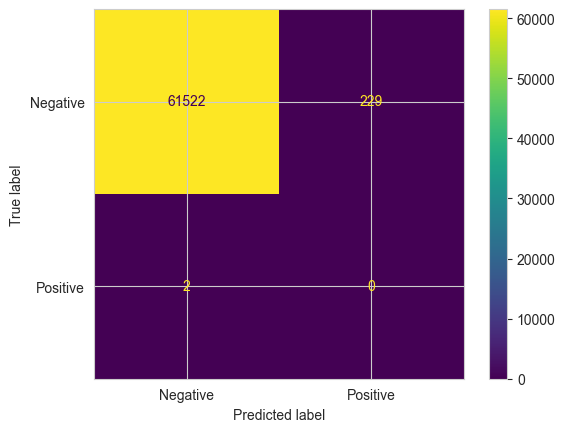

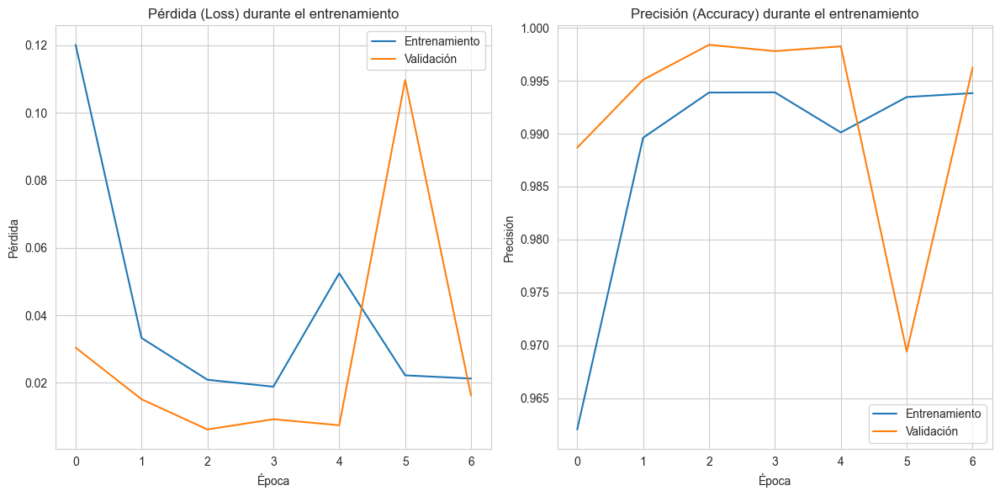

In [45]:
model_RN1_sob20000_2, preds_RN1_sob20000_2 = evaluar_red_neuronal_viz(data_sobremuestrada1[20000][0], data_sobremuestrada1[20000][1], X1_test, y1_test, epochs=7, batch_size=32)

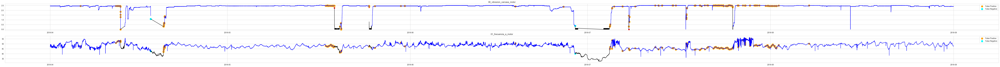

In [46]:
plot_sensors(sensores_reducidos[sensores_reducidos.columns[0:2].tolist() + ['NORMAL','RECOVERING','BROKEN']], preds_RN1_sob20000)

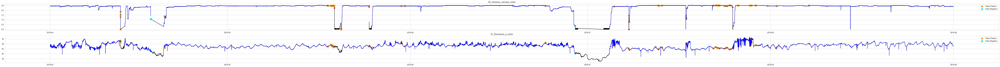

In [47]:
plot_sensors(sensores_reducidos[sensores_reducidos.columns[0:2].tolist() + ['NORMAL','RECOVERING','BROKEN']], preds_RN1_sob20000_2)

Epoch 1/30
7628/7628 [==============================] - 19s 2ms/step - loss: 0.1320 - accuracy: 0.9757 - val_loss: 0.0263 - val_accuracy: 0.9933
Epoch 2/30
7628/7628 [==============================] - 17s 2ms/step - loss: 0.0259 - accuracy: 0.9926 - val_loss: 0.0296 - val_accuracy: 0.9924
Epoch 3/30
7628/7628 [==============================] - 18s 2ms/step - loss: 0.0177 - accuracy: 0.9948 - val_loss: 0.0151 - val_accuracy: 0.9963
Epoch 4/30
7628/7628 [==============================] - 17s 2ms/step - loss: 0.0108 - accuracy: 0.9971 - val_loss: 0.0498 - val_accuracy: 0.9898
Epoch 5/30
7628/7628 [==============================] - 15s 2ms/step - loss: 0.0084 - accuracy: 0.9977 - val_loss: 0.0185 - val_accuracy: 0.9956
Epoch 6/30
7628/7628 [==============================] - 15s 2ms/step - loss: 0.0075 - accuracy: 0.9981 - val_loss: 0.0093 - val_accuracy: 0.9989
Epoch 7/30
7628/7628 [==============================] - 15s 2ms/step - loss: 0.0083 - accuracy: 0.9978 - val_loss: 0.0101 - val_ac

<Figure size 1000x600 with 0 Axes>

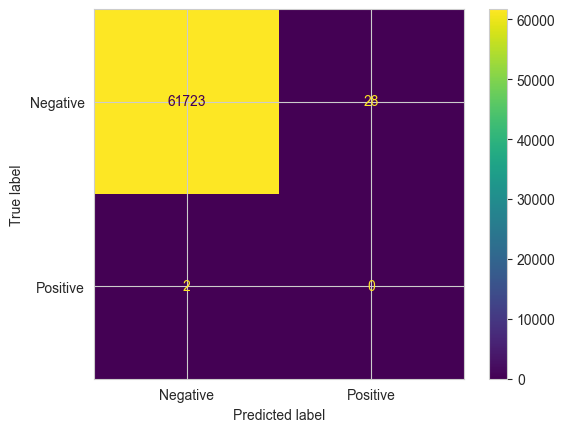

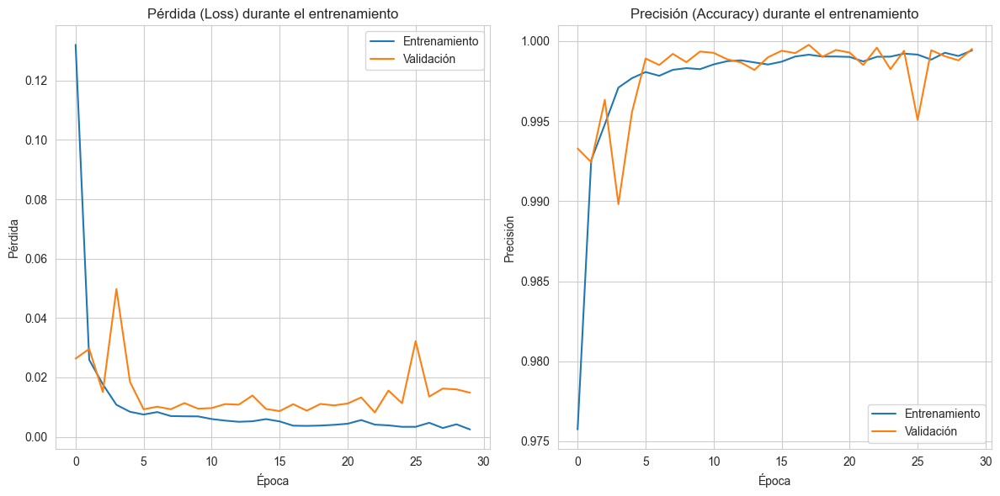

In [79]:
model_RN2_sob20000, preds_RN2_sob20000 = evaluar_red_neuronal_viz2(data_sobremuestrada[20000][0], data_sobremuestrada[20000][1], X_test, y_test, epochs=30, batch_size=32)

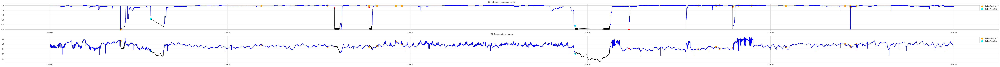

In [80]:
plot_sensors(sensores_reducidos[sensores_reducidos.columns[0:2].tolist() + ['NORMAL','RECOVERING','BROKEN']], preds_RN2_sob20000)

## Optimizacion de parametros de manera aleatoria

### Regresion logistica con Random Search

Fitting 3 folds for each of 10 candidates, totalling 30 fits
El accuracy es: 0.966511748417081
La precisión positiva es: 0.00048355899419729207
La precisión negativa es: 0.9999832453715339
El recall de sensibilidad es: 0.5
El recall de especificidad es: 0.96652685786465
El f1 positivo es: 0.0009661835748792271
El f1 negativo es: 0.982970453572252


<Figure size 1000x600 with 0 Axes>

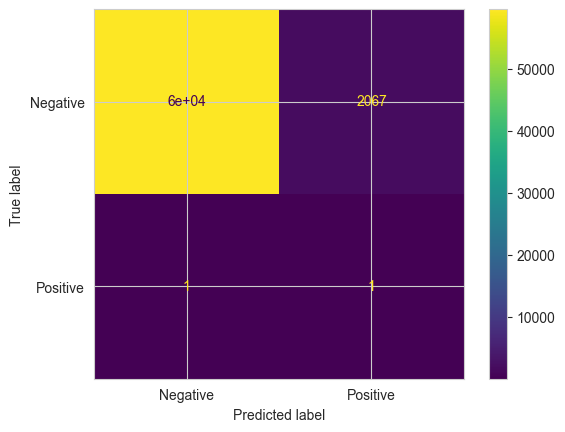

Mejores hiperparámetros:  {'solver': 'lbfgs', 'penalty': 'l2', 'C': 10}


In [58]:
modelo_RL_sob20000_RS, preds_RL_sob20000_RS = evaluar_modelo_logistica_RS(data_sobremuestrada[20000][0], data_sobremuestrada[20000][1], X_test, y_test)

## Redes neuronales con Random Search   

Fitting 3 folds for each of 20 candidates, totalling 60 fits
Epoch 1/20
1907/1907 [==============================] - 5s 2ms/step - loss: 0.0992 - accuracy: 0.9816 - val_loss: 0.0541 - val_accuracy: 0.9886
Epoch 2/20
1907/1907 [==============================] - 4s 2ms/step - loss: 0.0294 - accuracy: 0.9933 - val_loss: 0.0508 - val_accuracy: 0.9906
Epoch 3/20
1907/1907 [==============================] - 4s 2ms/step - loss: 0.0283 - accuracy: 0.9946 - val_loss: 0.0133 - val_accuracy: 0.9987
Epoch 4/20
1907/1907 [==============================] - 4s 2ms/step - loss: 0.0125 - accuracy: 0.9976 - val_loss: 0.0485 - val_accuracy: 0.9921
Epoch 5/20
1907/1907 [==============================] - 4s 2ms/step - loss: 0.0118 - accuracy: 0.9975 - val_loss: 0.0273 - val_accuracy: 0.9953
Epoch 6/20
1907/1907 [==============================] - 4s 2ms/step - loss: 0.0103 - accuracy: 0.9977 - val_loss: 0.0096 - val_accuracy: 0.9988
Epoch 7/20
1907/1907 [==============================] - 4s 2ms/step - loss:

<Figure size 1000x600 with 0 Axes>

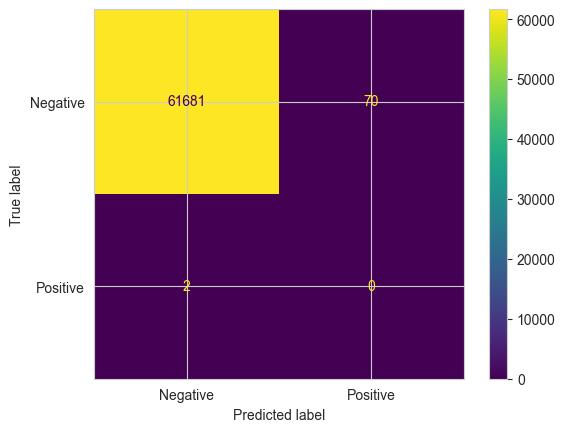

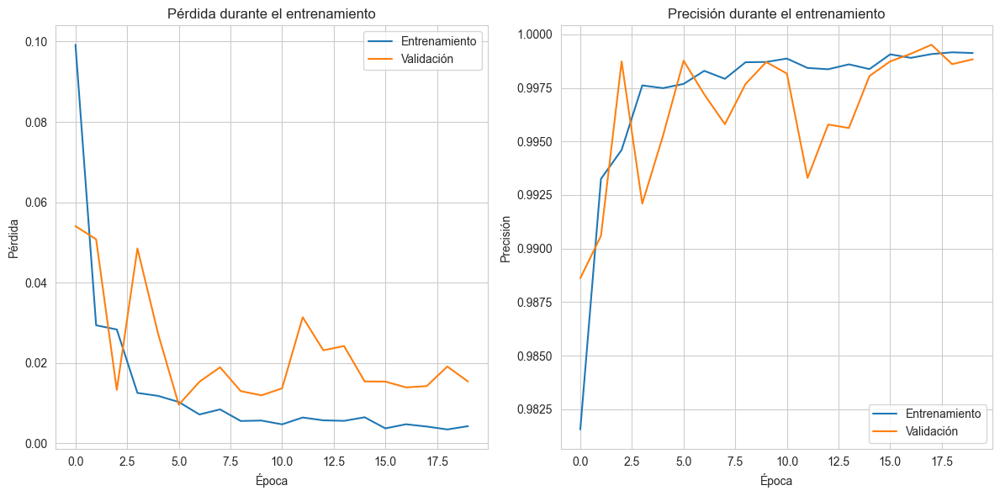

Mejores hiperparámetros:  {'optimizer': 'adam', 'neurons2': 128, 'neurons1': 64, 'epochs': 20, 'batch_size': 128}


In [62]:
model_RN_RS_sob20000, preds_RN_RS_sob20000 = evaluar_red_neuronal_viz_RS(data_sobremuestrada[20000][0], data_sobremuestrada[20000][1], X_test, y_test)

In [ ]:
plot_sensors(sensores_reducidos[sensores_reducidos.columns[0:2].tolist() + ['NORMAL','RECOVERING','BROKEN']], preds_RN_RS_sob20000)

Fitting 3 folds for each of 10 candidates, totalling 30 fits
Mejores hiperparámetros: {'optimizer': 'rmsprop', 'neurons3': 8, 'neurons2': 16, 'neurons1': 128, 'epochs': 10, 'batch_size': 64} 
Mejor score: 0.9993977627173218
1930/1930 [==============================] - 3s 1ms/step
Accuracy: 0.9992712904636212
Precision: 0.0
Recall: 0.0
F1 Score: 0.0
Matriz de confusión:
[[61708    43]
 [    2     0]]


<Figure size 1000x600 with 0 Axes>

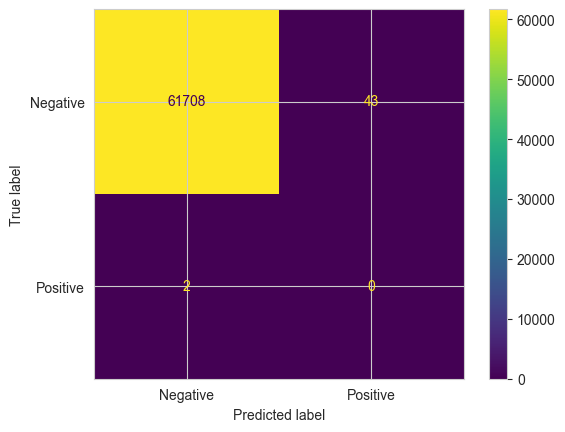

Mejores hiperparámetros:  {'optimizer': 'rmsprop', 'neurons3': 8, 'neurons2': 16, 'neurons1': 128, 'epochs': 10, 'batch_size': 64}


In [41]:
model_RN_RS2_sob20000, preds_RN_RS2_sob20000 = evaluar_red_neuronal_viz_RS2(data_sobremuestrada[20000][0], data_sobremuestrada[20000][1], X_test, y_test)

Fitting 3 folds for each of 20 candidates, totalling 60 fits
Epoch 1/10
7628/7628 [==============================] - 16s 2ms/step - loss: 0.0605 - accuracy: 0.9786 - val_loss: 0.0150 - val_accuracy: 0.9953
Epoch 2/10
7628/7628 [==============================] - 15s 2ms/step - loss: 0.0186 - accuracy: 0.9943 - val_loss: 0.0086 - val_accuracy: 0.9983
Epoch 3/10
7628/7628 [==============================] - 15s 2ms/step - loss: 0.0136 - accuracy: 0.9961 - val_loss: 0.0113 - val_accuracy: 0.9984
Epoch 4/10
7628/7628 [==============================] - 15s 2ms/step - loss: 0.0124 - accuracy: 0.9965 - val_loss: 0.0359 - val_accuracy: 0.9924
Epoch 5/10
7628/7628 [==============================] - 15s 2ms/step - loss: 0.0097 - accuracy: 0.9973 - val_loss: 0.0423 - val_accuracy: 0.9956
Epoch 6/10
7628/7628 [==============================] - 16s 2ms/step - loss: 0.0104 - accuracy: 0.9973 - val_loss: 0.0385 - val_accuracy: 0.9982
Epoch 7/10
7628/7628 [==============================] - 16s 2ms/step 

<Figure size 1000x600 with 0 Axes>

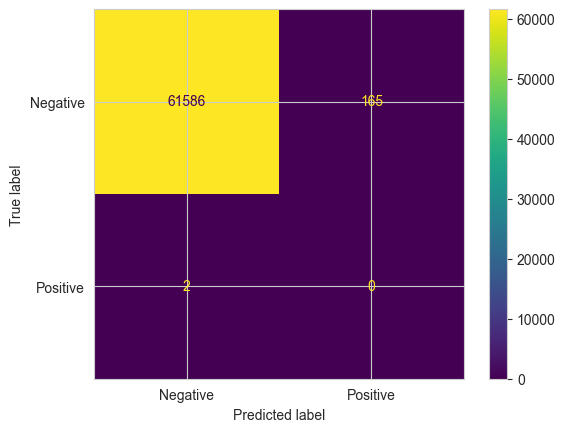

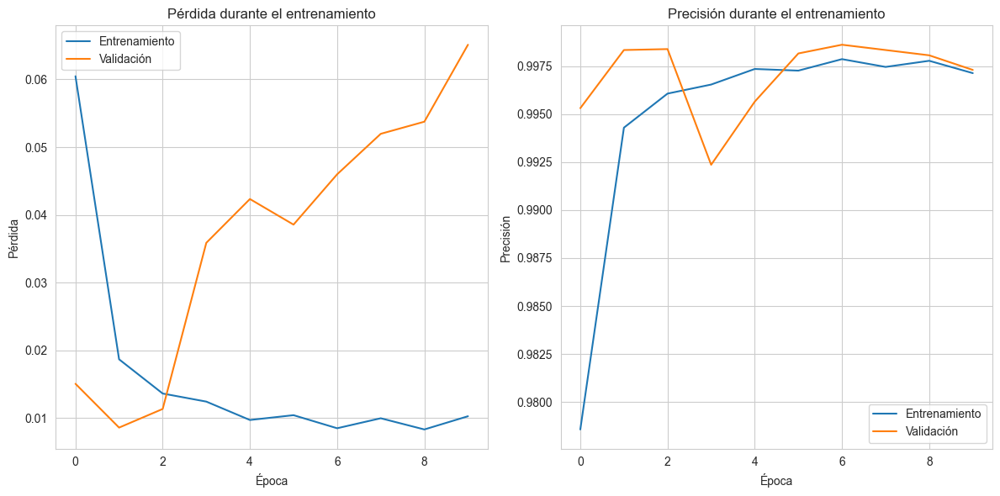

Mejores hiperparámetros:  {'optimizer': 'adam', 'neurons4': 8, 'neurons3': 32, 'neurons2': 32, 'neurons1': 64, 'epochs': 10, 'batch_size': 32}


In [44]:
model_RN_RS3_sob20000, preds_RN_RS3_sob20000 = evaluar_red_neuronal_viz_RS3(data_sobremuestrada[20000][0], data_sobremuestrada[20000][1], X_test, y_test)

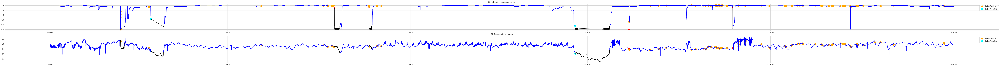

In [47]:
plot_sensors(sensores_reducidos[sensores_reducidos.columns[0:2].tolist() + ['NORMAL','RECOVERING','BROKEN']], preds_RN_RS3_sob20000)

# Conclusión

En primera instancia parece ser IMPOSIBLE predecir una falla futura, ya que al solo tener 7 situaciones de fallo son muy pocos datos para poder detectar algun tipo de tendencia.

Sin embargo, nuestros modelos de machine learning fueron capaces de identificar algunas tendencias y patrones en los datos que podrían ser útiles para el mantenimiento predictivo de la bomba.

Para trabajos futuros, sería interesante explorar otras técnicas de modelado, como los modelos de supervivencia y las redes neuronales, para ver si pueden mejorar la precisión de las predicciones. También podría ser útil recopilar más datos sobre las fallas de la bomba para tener un conjunto de datos más grande para entrenar los modelos.